In [1]:
import json
import pandas as pd
import os
from vega import VegaLite

pd.set_option('display.max_rows', 99999)

benchmark_dir = "../benchmarks"

def load_input_table(fname):
    with open(os.path.join(benchmark_dir, fname), "r") as f:
        benchmark = json.load(f)
        input_data = benchmark["input_data"]
        df = pd.DataFrame.from_records(input_data)
        return df

def wrap_vl_json(spec, df):
    data = df.to_json(orient='records')
    spec["data"] = {"values": json.loads(data)}
    return spec

In [2]:
df1 = load_input_table("001.json")

chart1 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"type": "line"},
            "encoding": {
                "y": {"field": "Number of Units", "type": "quantitative"},
                "x": { "field": "Quarter", "type": "nominal" }
            }
        }, 
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "encoding": {
                "y": {"type": "quantitative", "field": "Actual Profits"},
                "x": { "field": "Quarter", "type": "nominal" }
            }
        }
  ],
  "resolve": {"scale": {"y": "independent"}}
}

In [3]:
df2 = load_input_table("002.json")

df2 = pd.melt(df2, id_vars='Month', 
              value_vars=["Low (<50%}", "Medium (50%-80%}", "High (>80%)", "East", "West"])

chart2 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "transform": [{"filter": "datum.variable != \"East\" && datum.variable != \"West\""}],
            "encoding": {
                "color": {"field": "variable", "type": "nominal"},
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Month", "type": "temporal" }
            }
        }, 
        {
            "mark": {"type": "line", "stroke": "red"},
            "transform": [{"filter": "datum.variable == \"East\" || datum.variable == \"West\""}],
            "encoding": {
                "color": {"field": "variable", "type": "nominal"},
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Month", "type": "temporal" }
            }
        }
  ]
}

In [4]:
df3 = load_input_table("003.json")
df3_1 = df3["Net Cash Flow"].cumsum()
df3 = df3.join(df3_1, lsuffix='', rsuffix=' Sum')
df3 = df3.assign(c=df3["Net Cash Flow Sum"]-df3["Net Cash Flow"])

chart3 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": {"field": "Month", "type": "nominal", "sort": "none"},
        "y2": {
          "field": "Net Cash Flow Sum",
          "type": "quantitative"    
        },
        "y": {"field": "c", "type": "quantitative"},
        "color": {"field": "Net Cash Flow", "type": "quantitative"}
    }
}

In [5]:
df4 = load_input_table("004.json")

df4 = pd.melt(df4, id_vars='Age Group', 
              value_vars=["Female-1986", "Female-2050", "Male-1986", "Male-2050"])

split_col = df4["variable"].str.split("-", expand=True)
df4["gender"] = split_col[0]
df4["year"] = split_col[1]

chart4 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "line",
    "encoding": {
        "y": {"field": "Age Group", "type": "nominal", "sort": None},
        "x": {
          "field": "value",
          "type": "quantitative"    
        },
        "column": {"field": "gender", "type": "nominal"},
        "color": {"field": "year","type": "ordinal"}
    }
}

In [6]:
df5 = load_input_table("005.json")
df5 = pd.melt(df5, id_vars='Month', value_vars=["Cost", "Profit", "ROI", "Sales"])

chart5 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"type": "bar"},
            "transform": [{"filter": "datum.variable != \"ROI\""}],
            "encoding": {
                "x": { "field": "Month", "type": "nominal" },
                "color": {"field": "variable", "type": "nominal"},
                "y": {"field": "value", "type": "quantitative"}
            }
        },
        {
            "mark": {"type": "line", "stroke": "red"},
            "transform": [{"filter": "datum.variable == \"ROI\""}],
            "encoding": {
                "x": { "field": "Month", "type": "nominal" },
                "color": {"field": "variable", "type": "nominal"},
                "y": {"field": "value", "type": "quantitative"}
            }
        }
  ],
  "resolve": {"scale": {"y": "independent"}}
}

In [7]:
df6 = load_input_table("006.json")
df6 = pd.melt(df6, id_vars='Bucket', value_vars=["Actual", "Budgeted"])

chart6 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"type": "bar", "opacity":0.7},
    "encoding": {
        "color": {"field": "variable", "type": "nominal"},
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "Bucket", "type": "nominal" },
    }
}

In [8]:
df7 = load_input_table("007.json")

df7['id'] = df7.index
df7 = pd.melt(df7, id_vars='id', 
              value_vars=["Strongly Disagree", "Agree", "Disagree", "Strongly Agree"])

chart7 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"type": "bar"},
    "encoding": {
        "color": {"field": "variable", "type": "nominal"},
        "y": {"field": "id", "type": "nominal"},
        "x": { "field": "value", "type": "quantitative"}    
    }
}

In [9]:
df8 = load_input_table("008.json")
df8 = pd.melt(df8, id_vars='Value', value_vars=["Y1", "Y2", "Y3", "Y4", "Y5"])
df8 = df8.pivot(index='variable',columns='Value', values='value').reset_index()

chart8 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": "line",
            "encoding": {
                "x": { "field": "variable", "type": "nominal" },
                "y": {"field": "means", "type": "quantitative"}
            }
        }, 
        {
            "mark": {"opacity": 0.4, "type": "area"},
            "encoding": {
                "x": { "field": "variable", "type": "nominal" },
                "y": {"type": "quantitative", "field": "lower range"},
                "y2": {"type": "quantitative", "field": "upper range"}
            }
        }
  ]
}

In [10]:
df9 = load_input_table("009.json")
df9 = pd.melt(df9, id_vars=['Location', 'Rae'], value_vars=["2009", "2010", "2011", "2012", "2013", "2014"])

chart9 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "point",
    "encoding": {
        "x": { "field": "variable", "type": "nominal" },
        "y": {"field": "value", "type": "quantitative"},
        "color": {"field": "Location", "type": "nominal"},
        "column": {"field": "Rae", "type": "nominal"}
    }
}

In [11]:
df10 = load_input_table("010.json")
df10 = pd.melt(df10, id_vars="Class", value_vars=['Fall', 'Spring'])

chart10 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "circle",
    "encoding": {
        "y": {"field": "Class", "type": "nominal"},
        "x": { "field": "value", "type": "quantitative" },
        "color": {"field": "variable", "type": "nominal"}
    }

}

In [12]:
df11 = load_input_table("011.json")
df11 = pd.melt(df11, id_vars=["C1", "C2"], value_vars=["EMEA", "LATAM", "North_America", "APAC"])

chart11 = {
    "height": 100,
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "C2", "type": "nominal" },
        "column": {"field": "variable", "type": "nominal"},
        "row": {"field": "C1", "type": "nominal"}
    }
}

In [13]:
df12 = load_input_table("012.json")
df12 = pd.melt(df12, id_vars=["C1", "C2"], value_vars=["EMEA", "LATAM", "North_America", "APAC"])

chart12 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "line",
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "C2", "type": "nominal" },
        "column": {"field": "variable", "type": "nominal"},
        "color": {"field": "C1", "type": "nominal"}
    }
}

In [14]:
df13 = load_input_table("013.json")
df13 = pd.melt(df13, id_vars=["Totals", "Value"], value_vars=["alpha", "beta", "gamma"])
df13['cumsum'] = df13.groupby("Value")['value'].transform(pd.Series.cumsum)

chart13 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [{
        "mark": "bar",
        "encoding": {
            "x": { "field": "Value", "type": "nominal" },
            "y": { "field": "value", "type": "quantitative"},
            "color": {"field": "variable", "type": "nominal"},
            "order": {"field": "variable", "type": "quantitative", "sort": "ascending"}
        }
    },  {
      "mark": "point",
      "encoding": {
        "x": { "field": "Value", "type": "nominal" },
        "y": { "field": "cumsum", "type": "quantitative"},
        "text": {"field": "value", "type": "quantitative"}
      }
    }]
}

In [15]:
df14 = load_input_table("014.json")
split_col = df14["End of Shift"].str.split("/", expand=True)
df14["s1"] = [int(x) for x in split_col[0]]
split_col = df14["Start of Shift"].str.split("/", expand=True)
df14["s0"] = [int(x) for x in split_col[0]]

chart14 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "s0", "type": "quantitative"},
        "x2": { "field": "s1", "type": "quantitative"},
        "y": { "field": "Shift", "type": "nominal"}
    }
}

In [16]:
df15 = load_input_table("015.json")
split_col = df15["End of Shift"].str.split("/", expand=True)
df15["s1"] =  [int(x) for x in split_col[0]]
split_col = df15["Start of Shift"].str.split("/", expand=True)
df15["s0"] =  [int(x) for x in split_col[0]]

chart15 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "rect",
    "encoding": {
        "y": { "field": "s0", "type": "quantitative"},
        "x": { "field": "Period", "type": "nominal"},
        "y2": { "field": "s1", "type": "quantitative"},
    }
}

In [17]:
df16 = load_input_table("016.json")
df16["c"] = df16["Amount"] + df16["Variance"]

chart16 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "Year", "type": "nominal"},
        "y": { "field": "Amount", "type": "quantitative"},
        "y2": { "field": "c", "type": "quantitative"},
        "color": {"field": "Variance", "type": "quantitative"}
    }
}

In [18]:
df17 = load_input_table("017.json")
df17 = pd.melt(df17, id_vars=["Year"], value_vars=["Actual", "Projected"])

chart17 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "line",
    "encoding": {
        "x": { "field": "Year", "type": "nominal"},
        "y": { "field": "value", "type": "quantitative"},
        "color": { "field": "variable", "type": "nominal"}
}}

In [19]:
df18 = load_input_table("018.json")
df18 = pd.melt(df18, id_vars='Item', value_vars=["2012", "2013", "2014", "2015"])

chart18 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [{
        "mark": "bar",
        "transform": [{"filter": "datum.Item == \"Desktop Computers\" || datum.Item == \"Laptops\""}],
        "encoding": {
            "x": { "field": "variable", "type": "nominal"},
            "y": { "field": "value", "type": "quantitative"},
            "color": {"field": "Item", "type": "nominal"},
        }},{
        "mark": {"type": "line"},
        "transform": [{"filter": "datum.Item != \"Desktop Computers\" && datum.Item != \"Laptops\""}],
        "encoding": {
            "x": { "field": "variable", "type": "nominal"},
            "y": { "field": "value", "type": "quantitative"},
            "color": {"field": "Item", "type": "nominal"},
        }
    }]
}

In [20]:
df19 = load_input_table("019.json")

df19["cuts"] = pd.cut(df19['Purchase Amount'], 20, precision=0)
df19 = df19.groupby(['cuts']).count().reset_index()

df19["csum"] = df19["Purchase Amount"].cumsum()
df19["cuts"] = [str("({},{}]".format(int(x.left), int(x.right))) for x in df19["cuts"]]

chart19 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [{
        "mark": "bar",
        "encoding": {
            "x": { "field": "cuts", "type": "ordinal", "sort": "none"},
            "y": { "field": "Purchase Amount", "type": "quantitative"},
        }
    },{
        "mark": "line",
        "encoding": {
            "x": { "field": "cuts", "type": "ordinal", "sort": "none"},
            "y": { "field": "csum", "type": "quantitative"},
            "order": {"field": "id", "type": "ordinal"}
        }
    }],
    "resolve": {"scale": {"y": "independent"}}
}

In [21]:
df20 = load_input_table("020.json")
df20 = df20.groupby(['Product', "Country"])["Amount"].sum().reset_index()

chart20 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "Country", "type": "nominal"},
        "color": { "field": "Product", "type": "nominal"},
        "y": { "field": "Amount", "type": "quantitative"}        
    }
}

In [22]:
df21 = load_input_table("021.json")
df21 = pd.melt(df21, id_vars=['Country', "Total Result"], value_vars=["Beans", "Broccoli", "Carrots"])
df21 = df21[df21["Country"] != "Total Result"]

chart21 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "variable", "type": "nominal"},
        "color": { "field": "variable", "type": "nominal"},
        "y": { "field": "value", "type": "quantitative"},
        "column": { "field": "Country", "type": "nominal"},
        
    }
}

In [23]:
df22 = load_input_table("022.json")
df22 = pd.melt(df22, id_vars='label', value_vars=["2008", "2009", "2010", "2011", "2012", "2013"])

chart22 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "circle",
    "encoding": {
        "x": { "field": "variable", "type": "nominal"},
        "size": { "field": "value", "type": "quantitative"},
        "y": { "field": "label", "type": "nominal"}
    }
}

In [24]:
df23 = load_input_table("023.json")

split_col = df23["data_ora"].str.split("_", expand=True)
df23["day"] =  [str(x) for x in split_col[0]]
df23["hour"] =  [str(x) for x in split_col[1]]

chart23 = {
    "height": 200,
    "width": 200,
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "rect",
    "encoding": {
        "x": { "field": "day", "type": "nominal"},
        "color": { "field": "value", "type": "quantitative"},
        "y": { "field": "hour", "type": "nominal"},
        "column": { "field": "site", "type": "nominal"},
        "row": { "field": "type", "type": "nominal"}
    }
}

In [25]:
df24 = load_input_table("024.json")
df24["End Date"] = df24["Start Date"] + df24['Duration']

chart24 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "y": { "field": "Parts", "type": "nominal", "sort": "null"},
        "x": { "field": "Start Date", "type": "temporal"},
        "x2": { "field": "End Date", "type": "temporal"}
    }
}

In [26]:
df25 = load_input_table("025.json")
df25["cumsum"] = df25["Count"].cumsum()

chart25 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer":[{
        "mark": "bar",
        "encoding": {
            "x": { "field": "Complaint Type", "type": "nominal", "sort": None},
            "y": { "field": "Count", "type": "quantitative"}
        }
    },{
        "mark": {"type": "line", "color": "red"},
        "encoding": {
            "x": { "field": "Complaint Type", "type": "nominal", "sort": None},
            "y": { "field": "cumsum", "type": "quantitative"},
            "order": { "field": "id", "type": "ordinal"}
        }
    }],
  "resolve": {"scale": {"y": "independent"}}
}

In [27]:
df26 = load_input_table("026.json")
split_col = df26["data_ora"].str.split("_", expand=True)
df26["day"] =  [str(x) for x in split_col[0]]
df26["hour"] =  [str(x) for x in split_col[1]]
df26 = df26.groupby(["day", "hour"])["value"].sum().reset_index()

chart26 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "rect",
    "encoding": {
        "x": { "field": "day", "type": "ordinal"},
        "color": { "field": "value", "type": "quantitative"},
        "y": { "field": "hour", "type": "ordinal"},
    }
}

In [28]:
df27 = load_input_table("027.json")
df27 = pd.melt(df27, id_vars=['Period'], 
               value_vars=["00", "01", "02", "03", "04", '05', '06', "07", "08", "09", "10", "11"])

chart27 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "line",
    "encoding": {
        "x": { "field": "variable", "type": "nominal"},
        "y": { "field": "value", "type": "quantitative"},
        "color": { "field": "Period", "type": "nominal"},
    }
}

In [29]:
df28 = load_input_table("028.json")

df28["cuts"] = pd.cut(df28['Number of students'], 5, precision=0)
df28 = df28.groupby(['cuts']).count().reset_index()
df28["cuts"] = [str("({},{}]".format(int(x.left), int(x.right))) for x in df28["cuts"]]

chart28 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "cuts", "type": "nominal"},
        "y": { "field": "Number of students", "type": "quantitative"},
    }
}

In [30]:
df29 = load_input_table("029.json")

df29 = pd.melt(df29, id_vars=['Sport', "Rank"], 
               value_vars=["Endurance", "Strength", "Power", "Speed", 
                           "Agility", "Flexibility", "Nerve", "Durability", 
                           "Hand-Eye Coordination", "Analytical Aptitude"])
df29["Archery"] = df29["Sport"] == "Archery"

chart29 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "point",
    "encoding": {
        "x": { "field": "value", "type": "quantitative"},
        "y": { "field": "variable", "type": "nominal"},
        "size": {"field": "Archery", 'type': "nominal"}
    }  
}

/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1472: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


In [31]:
df30 = load_input_table("030.json")

df30 = pd.melt(df30, id_vars=['Sport', "Rank"], 
                     value_vars=["Endurance", "Strength", "Power", "Speed", 
                                 "Agility", "Flexibility", "Nerve", "Durability", 
                                 "Hand-Eye Coordination", "Analytical Aptitude"])
df30["Archery"] = df30["Sport"] == "Archery"

chart30 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "circle",
    "encoding": {
        "y": { "field": "value", "type": "quantitative"},
        "column": {"field": "variable", 'type': "nominal"},
        "size": {"field": "Archery", 'type': "nominal"}
    }
}

In [32]:
df31 = load_input_table("031.json")

chart31 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "circle",
    "encoding": {
        "x": { "field": "Performance Rating", "type": "nominal"},
        "color": { "field": "Performance Rating", "type": "nominal"},
        "column": {"field": "Group Name", 'type': "nominal"},
        "y": {"field": "Salary Increase $", 'type': "quantitative"}
    }
   
}

In [33]:
df32 = load_input_table("032.json")

df32 = pd.melt(df32, id_vars="id", value_vars=["Serie1_y", "Serie2_y"])

chart32 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "line",
    "encoding": {
        "x": { "field": "id", "type": "quantitative"},
        "color": { "field": "variable", "type": "nominal"},
        "y": {"field": "value", 'type': "quantitative"}
    }  
}

In [34]:
df33 = load_input_table("033.json")

df33 = pd.melt(df33, id_vars="activity", 
               value_vars=["0", "5", "10", "15", "20", "25", "30", "35", "40", 
                           "45", "50", "55", "60", "65", "70", "75", "80", "85", 
                           "90", "95", "100", "105", "110", "115", "120", "125", 
                           "130", "135", "140", "145", "150", "155", "160", "165", 
                           "170", "175", "180", "185", "190", "195", "200", "205", 
                           "210", "215", "220", "225", "230", "235", "240", "245", 
                           "250", "255", "260", "265", "270", "275", "280", "285", 
                           "290", "295", "300", "305", "310", "315", "320", "325", 
                           "330", "335", "340", "345", "350", "355", "360", "365", 
                           "370", "375", "380", "385", "390", "395", "400", "405", 
                           "410", "415", "420", "425", "430", "435", "440", "445", 
                           "450", "455", "460", "465", "470", "475", "480", "485", 
                           "490", "495", "500", "505", "510", "515", "520", "525", 
                           "530", "535", "540", "545", "550", "555", "560", "565", 
                           "570", "575", "580", "585", "590", "595", "600", "605", 
                           "610", "615", "620", "625", "630", "635", "640", "645", 
                           "650", "655", "660", "665", "670", "675", "680", "685", 
                           "690", "695", "700", "705", "710", "715", "720", "725", 
                           "730", "735", "740", "745", "750", "755", "760", "765", 
                           "770", "775", "780", "785", "790", "795", "800", "805", 
                           "810", "815", "820", "825", "830", "835", "840", "845", 
                           "850", "855", "860", "865", "870", "875", "880", "885", 
                           "890", "895", "900", "905", "910", "915", "920", "925", 
                           "930", "935", "940", "945", "950", "955", "960", "965", 
                           "970", "975", "980", "985", "990", "995", "1000", "1005", 
                           "1010", "1015", "1020", "1025", "1030", "1035", "1040", 
                           "1045", "1050", "1055", "1060", "1065", "1070", "1075", 
                           "1080", "1085", "1090", "1095", "1100", "1105", "1110", 
                           "1115", "1120", "1125", "1130", "1135", "1140", "1145", 
                           "1150", "1155", "1160", "1165", "1170", "1175", "1180", 
                           "1185", "1190", "1195", "1200", "1205", "1210", "1215", 
                           "1220", "1225", "1230", "1235", "1240", "1245", "1250", 
                           "1255", "1260", "1265", "1270", "1275", "1280", "1285", 
                           "1290", "1295", "1300", "1305", "1310", "1315", "1320", 
                           "1325", "1330", "1335", "1340", "1345", "1350", "1355", 
                           "1360", "1365", "1370", "1375", "1380", "1385", "1390", 
                           "1395", "1400", "1405", "1410", "1415", "1420", "1425", "1430", "1435"])
chart33 = {
    "width": 120,
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "variable", "type": "nominal"},
        "column": {"field": "activity", 'type': "nominal"},
        "y": {"field": "value", 'type': "quantitative"}
    },
    "config": {"axisX": {"labels": False, "ticks": False}}
}

In [35]:
df34 = load_input_table("034.json")
df34 = pd.melt(df34, id_vars="Timeline", 
               value_vars=["Forecast", "Lower Confidence Bound", 
                           "Upper Confidence Bound", "Values"])
df34 = df34[df34["value"] != ""]

chart34 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "line",
    "encoding": {
        "x": { "field": "Timeline", "type": "temporal"},
        "color": {"field": "variable", 'type': "nominal"},
        "y": {"field": "value", 'type': "quantitative"}
    }
}

In [36]:
df35 = load_input_table("035.json")
df35 = pd.melt(df35, id_vars=["DATA"], value_vars=["Lower", "Upper", "Value"])

chart35 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
          "mark": {"type": "bar", "opacity": 0.5},
          "transform": [{"filter": "datum.variable == \"Value\""}],
          "encoding": { "x": {"field": "DATA", "type": "nominal"},
                        "y": { "field": "value", "type": "quantitative" }}
        },
        {
          "mark": {"type": "point"},
          "transform": [{"filter": "datum.variable != \"Value\""}],
          "encoding": {
            "x": {"field": "DATA", "type": "nominal"},
            "y": {"field": "value", "type": "quantitative"},
            "color": {"field": "variable", "type": "nominal"}
          }
        }
    ]
}

In [37]:
df36 = load_input_table("036.json")
df36["VolumeDiff"] = df36["Volume"].diff()
df36 = pd.melt(df36, id_vars=["Close", "Date"], value_vars=["VolumeDiff", "Volume"])

df36["color"] = df36['value'] > 0
df36["value"] = df36["value"].abs()

chart36 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
      "mark": "area",
      "encoding": {
        "x": {"field": "Date", "type": "temporal"},
        "y": {"field": "value", "type": "quantitative"},
        "color": {"field": "color", "type": "nominal"},
        "column": {"field": "variable", "type": "nominal" }
      }
}

In [38]:
df37 = load_input_table("037.json")

df37 = pd.melt(df37, id_vars=["TOTAL", "Category"], value_vars=["<-10%", "<0%", ">10%", ">=0%"])
df37["value"] = df37["TOTAL"] - df37["value"]

chart37 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"type": "bar"},
    "encoding": {
        "color": {"field": "variable", "type": "nominal"},
        "y": {"field": "Category", "type": "nominal"},
        "x": { "field": "value", "type": "quantitative"}    
    }
}

In [39]:
df38 = load_input_table("038.json")

df38 = pd.melt(df38, id_vars=["x"], value_vars=["group1", "group2", "group3", "group4"])

chart38 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": {
    "type": "area"
  },
  "encoding": {
    "x": {"field": "x","type": "ordinal"},
    "y": { "field": "value", "type": "quantitative" },
    "color": { "field": "variable", "type": "nominal" }
  }
}

In [40]:
df39 = load_input_table("039.json")
df39 = pd.melt(df39, id_vars=["Year"], 
               value_vars=["NORTH-Bisc", "NORTH-Choc", "SOUTH-Bisc", 
                           "SOUTH-Choc", "WEST-Bisc", "WEST-Choc"])

split_col = df39["variable"].str.split("-", expand=True)
df39["loc"] = split_col[0]
df39["type"] = split_col[1]
df39 = df39.pivot_table(index=["Year", "loc"], columns='type', values=['value']).reset_index()
df39.columns = ["Year", "loc", "Bisc", "Choc"]

chart39 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": {
    "type": "area"
  },
  "encoding": {
    "x": {"field": "Year","type": "ordinal"},
    "y": { "field": "Bisc", "type": "quantitative" },
    "y2": { "field": "Choc", "type": "quantitative" },
    "column": { "field": "loc", "type": "nominal" }
  }
}

In [41]:
df40 = load_input_table("040.json")

df40["end"] = df40["Value"].cumsum()
df40["start"] = df40["end"] - df40["Value"]

chart40 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": {
    "type": "bar"
  },
  "encoding": {
    "x": {"field": "start","type": "quantitative"},
    "x2": {"field": "end","type": "quantitative"},
    "color": { "field": "Win / Loss", "type": "nominal" },
    "y": { "field": "Win / Loss", "type": "nominal" }
  }
}

In [42]:
df41 = load_input_table("041.json")
df41 = pd.melt(df41, id_vars='Year', value_vars=["Cod", "Crustaceans", "Herring", "Scorpion.fishes", "Tuna"])

chart41 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": {
    "type": "line"
  },
  "encoding": {
    "x": {"field": "Year", "type": "ordinal"},
    "color": { "field": "variable", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" }
  }
}

In [43]:
df42 = load_input_table("042.json")
df42 = pd.melt(df42, id_vars='date', value_vars=["var0", "var1"])

chart42 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": {
    "type": "line"
  },
  "encoding": {
    "x": {"field": "date", "type": "temporal"},
    "color": { "field": "variable", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" }
  }
}

In [44]:
df43 = load_input_table("043.json")

df43 = pd.melt(df43, id_vars=["depth", "price", "table", "x", "y", "z", "carat"], 
               value_vars=["clarity", "color", "cut"])
df43 = df43.groupby(['variable', "value"]).count().reset_index()

chart43 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {
        "type": "bar"
    },
    "width": 200,
    "encoding": {
        "x": {"field": "value", "type": "nominal"},
        "column": { "field": "variable", "type": "nominal" },
        "y": { "field": "depth", "type": "quantitative" }
    }
}

In [45]:
df44 = load_input_table("044.json")

df44 = pd.melt(df44, id_vars=["Species"], value_vars=["Petal.Length","Petal.Width","Sepal.Length","Sepal.Width"])
df44 = df44.groupby(['Species', "variable"]).sum().reset_index()

chart44 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": {
    "type": "bar"
  },
  "encoding": {
    "x": {"field": "Species", "type": "nominal"},
    "color": { "field": "variable", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" }
  }
}

In [46]:
df45 = load_input_table("045.json")
df45 = pd.melt(df45, id_vars=["X1"], value_vars=["B1", "B2", "B3", "B4"])

chart45 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": {
    "type": "bar"
  },
  "encoding": {
    "x": {"field": "X1", "type": "nominal"},
    "color": { "field": "variable", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" }
  }
}

In [47]:
df46 = load_input_table("046.json")
df46["Y2K"] = pd.to_datetime(df46['date']).dt.year < 2000
df46 = pd.melt(df46, id_vars=["date", "Y2K"], value_vars=["psavert", "uempmed"])

chart46 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "line" },
  "encoding": {
    "x": {"field": "date", "type": "temporal"},
    "color": { "field": "variable", "type": "nominal" },
    "strokeOpacity": { "field": "Y2K", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" }
  }
}

In [48]:
df47 = load_input_table("047.json")
df47["mutate_a"] = df47['total'] - df47['ok']
df47 = pd.melt(df47, id_vars=["label"], value_vars=["ok", "mutate_a"])

chart47 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "bar" },
  "encoding": {
    "x": {"field": "label", "type": "nominal"},
    "color": { "field": "variable", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" }
  }
}

In [49]:
df48 = load_input_table("048.json")
df48 = df48.groupby("category").sum().reset_index()
df48 = pd.melt(df48, id_vars=["category", "totalABC"], value_vars=["A", "B", "C"])
df48["value"] = df48["totalABC"] - df48["value"]
chart48 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "bar" },
  "encoding": {
    "x": {"field": "category", "type": "nominal"},
    "color": { "field": "variable", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" }
  }
}

In [50]:
df49 = load_input_table("049.json")
splits = pd.DataFrame(df49["scenario"].str.split('_', 2).tolist(), columns = ['scenario1','row', "drain"])
df49 = pd.concat([df49, splits], axis=1).reset_index()
df49 = df49.pivot_table(index=["row", "drain"], columns='scenario1', values='value').reset_index()
chart49 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "point" },
  "encoding": {
    "x": {"field": "measured", "type": "nominal"},
    "color": { "field": "row", "type": "nominal" },
    "y": { "field": "simulated", "type": "quantitative" },
    "column": { "field": "drain", "type": "nominal" }
  }
}

In [51]:
df50 = load_input_table("050.json")
df50 = pd.melt(df50, id_vars='id', value_vars=["Consuntivo 2010", "Consuntivo 2011", "Obiettivo 2011"])
chart50 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "line" },
  "encoding": {
    "x": {"field": "id", "type": "ordinal"},
    "color": { "field": "variable", "type": "nominal" },
    "y": { "field": "value", "type": "quantitative" },
  }
}

In [52]:
df51 = load_input_table("051.json")
df51 = df51.pivot_table(index=["Condition", "Sex"], columns='Feature', values='value').reset_index()
df51["p"] =  (df51["A"] + df51["Aneg"])
chart51 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "bar"},
  "encoding": {
    "x": {"field": "Condition", "type": "nominal"},
    "color": { "field": "Condition", "type": "nominal" },
    "y": { "field": "p", "type": "quantitative" },
    "column": { "field": "Sex", "type": "nominal" }
  }
}

In [53]:
df52 = load_input_table("052.json")
df52 = pd.melt(df52, id_vars=["Label"], value_vars=["bar 0", "bar 1", "bar 2", "bar 3"])

chart52 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Label", "type": "nominal" },
                "color": { "field": "variable", "type": "nominal" }
            }
        }, 
        {
            "mark": {"type": "line"},
            "transform": [{"filter": "datum.variable == \"bar 1\" || datum.variable == \"bar 3\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Label", "type": "nominal" },
                "color": { "field": "variable", "type": "nominal" }
            }
        }
  ],
  "resolve": {"scale": {"y": "independent"}}
}

In [54]:
df53 = load_input_table("053.json")
df53 = df53.groupby(['classes', 'date']).count().reset_index()
chart53 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "bar"},
  "encoding": {
    "y": {"field": "date", "type": "nominal"},
    "color": { "field": "classes", "type": "nominal" },
    "x": { "field": "score", "type": "quantitative" },
  }
}

In [55]:
df54 = load_input_table("054.json")
df54["y2"] = df54["h_bar"] + df54["h"]

chart54 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "encoding": {
                "y": {"field": "h", "type": "quantitative"},
                "x": { "field": "x", "type": "nominal" },
                "y2": { "field": "y2", "type": "nominal" }
            }
        }, 
        {
            "mark": {"type": "line"},
            "encoding": {
                "y": {"field": "h", "type": "quantitative"},
                "x": { "field": "x", "type": "nominal" }
            }
        }
  ],
  "resolve": {}
}

In [56]:
df55 = load_input_table("055.json")

splits = pd.DataFrame(df55["group_measure"].str.split('_', 1).tolist(), columns = ['val1',"val2"])
df55 = pd.concat([df55, splits], axis=1).reset_index()
df55 = df55.pivot_table(index=["id", "val2"], columns='val1', values='value').reset_index()

chart55 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "point"},
  "encoding": {
    "y": {"field": "a", "type": "quantitative"},
    "x": { "field": "b", "type": "quantitative" },
    "column": { "field": "val2", "type": "nominal" },
  }
}

In [57]:
df56 = load_input_table("056.json")
df56 = pd.melt(df56, id_vars=["grp", "time"], 
               value_vars=["02", "03", "04", "05", "06", 
                           "07", "08", "09", "10", "11"])

chart56 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "rect"},
  "encoding": {
    "y": {"field": "variable", "type": "nominal"},
    "x": { "field": "grp", "type": "nominal" },
    "column": { "field": "time", "type": "nominal" },
    "color": { "field": "value", "type": "quantitative" },
  }
}

In [58]:
df57 = load_input_table("057.json")
df57 = pd.melt(df57, id_vars=[], value_vars=["x_1", "x_2", "x_3", "x_4", "y_1", "y_2", "y_3", "y_4"])
splits = pd.DataFrame(df57["variable"].str.split('_', 1).tolist(), columns = ['axis','group'])
df57 = pd.concat([df57, splits], axis=1).reset_index()
df57['g'] = df57.groupby(['axis', "group"])['axis'].cumcount()
df57 = df57.pivot_table(index=["group", "g"], columns='axis', values='value').reset_index()

chart57 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "point"},
  "encoding": {
    "x": {"field": "x", "type": "quantitative"},
    "y": { "field": "y", "type": "quantitative" },
    "column": { "field": "group", "type": "nominal" }
  }
}

In [59]:
df58 = load_input_table("058.json")

chart58 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "bar"},
  "encoding": {
    "x": {"field": "count", "type": "quantitative"},
    "y": { "field": "date", "type": "nominal" },
    "column": { "field": "retailer", "type": "nominal" },
    "color": { "field": "type", "type": "nominal" }
  }
}

In [60]:
df59 = load_input_table("059.json")

df59 = pd.melt(df59, id_vars=["name", "ID"], 
                value_vars=["personsg1_0min", "personsg1_10min", 
                            "personsg1_30min", "personsg2_0min", 
                            "personsg2_10min", "personsg2_30min"])

split_col = df59["variable"].str.split("_", expand=True)
df59["group"] = split_col[0]
df59["time"] = split_col[1]
df59 = df59.pivot_table(index=["ID", "time"], columns='group', values='value').reset_index()

chart59 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "point"},
  "encoding": {
    "x": {"field": "personsg1", "type": "quantitative"},
    "y": { "field": "personsg2", "type": "quantitative" },
    "column": { "field": "ID", "type": "nominal" }
  }
}

In [61]:
df60 = load_input_table("060.json")
df60['g'] = df60.groupby(['fac'])['score'].cumcount()
df60 = df60.pivot_table(index=["g"], columns='fac', values='score').reset_index()

chart60 = {
  "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
  "mark": { "type": "line"},
  "encoding": {
    "x": {"field": "trial2", "type": "quantitative"},
    "y": { "field": "trial1", "type": "quantitative" }
  }
}

In [62]:
df_t1 = load_input_table("test_1.json")
df_t1 = pd.melt(df_t1, id_vars='x', value_vars=["bar 1","bar 2", "bar 3", "bar 0"])

chart_t1 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "encoding": {
                "x": { "field": "x", "type": "nominal"},
                "color": { "field": "variable", "type": "nominal"},
                "y": { "field": "value", "type": "quantitative"}
            }
        },
        {
            "mark": {"type": "line"},
            "transform": [{"filter": "datum.variable == \"bar 1\""}],
            "encoding": {
                "y": {"type": "quantitative", "field": "value"},
                "x": { "field": "x", "type": "nominal" }
            }
        }
  ],
  "resolve": {"scale": {"y": "independent"}}
}

In [63]:
df_t2 = load_input_table("test_2.json")
df_t2 = pd.melt(df_t2, id_vars='Country', 
                value_vars=["1_1","1_2","1_3","1_4", "1_5","1_6","1_7","1_8",
                            "1_9","1_10", "1_11","1_12","2_1","2_2","2_3","2_4",
                            "2_5","2_6","2_7", "2_8","2_9", "2_10","2_11","2_12"])
split_col = df_t2["variable"].str.split("_", expand=True)
df_t2["l1"] = split_col[0]
df_t2["l2"] = split_col[1]
df_t2.reset_index()

chart_t2 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "line",
    "encoding": {
        "x": { "field": "l2", "type": "nominal"},
        "color": { "field": "l1", "type": "nominal"},
        "y": { "field": "value", "type": "quantitative"},
        "column": {"field": "Country", "type": "nominal"}
    }
}

In [64]:
df_t3 = load_input_table("test_3.json")
df_t3["data"] = [str(d) for d in df_t3["data"]]
df_t3["id"] = [int(x) for x in df_t3.index]

df_t3["diff"] = df_t3["data"] > df_t3["data"].shift(1)

chart_t3 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "id", "type": "nominal"},
        "color": { "field": "diff", "type": "nominal"},
        "y": { "field": "data", "type": "quantitative"},
        "order": {"field": "id"}
    }
}

In [65]:
df_t4 = load_input_table("test_4.json")
df_t4 = pd.melt(df_t4, id_vars='Period', 
                value_vars=["APPRENTICE","CLERICAL","ENGINEERING SPECIALIST",
                            "MAJOR EXECUTIVE","SKILLED LABOR","MINOR EXECUTIVE",
                            "SALESMAN","NO CLASS","MISC."])

chart_t4 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": "bar",
    "encoding": {
        "x": { "field": "value", "type": "quantitative"},
        "color": { "field": "variable", "type": "nominal"},
        "y": { "field": "Period", "type": "nominal"}
    }
}

In [66]:
df_t5 = load_input_table("test_5.json")

df_t5 = pd.melt(df_t5, id_vars='id', value_vars=["cat 1", "cat 2", "cat 3", "cat 4", "cat 5", "cat 6"])

df_t5_1 = df_t5.groupby(['id'])["value"].sum().reset_index()

df_t5 = pd.concat([df_t5, df_t5_1], sort=False)
df_t5 = df_t5.fillna("sum")

chart_t5 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"type": "bar"},
            "transform": [{"filter": "datum.variable != \"sum\""}],
            "encoding": {
                "y": { "field": "value", "type": "quantitative"},
                "color": { "field": "variable", "type": "nominal"},
                "x": { "field": "id", "type": "nominal"}
            }
        },
        {
            "mark": {"opacity": 0.4, "type": "area"},
            "transform": [{"filter": "datum.variable == \"sum\""}],
            "encoding": {
                "y": {"type": "quantitative", "field": "value"},
                "color": { "field": "variable", "type": "nominal"},
                "x": { "field": "id", "type": "nominal" }
            }
        }
  ]
}

In [67]:
df_t6 = load_input_table("test_6.json")
df_t6 = pd.melt(df_t6, id_vars=['time', "Passengers", "Station"], value_vars=["500", "1000","1500","2000","2500"])

chart_t6 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"type": "area"},
    "encoding": {
        "x": { "field": "time", "type": "nominal"},
        "color": { "field": "variable", "type": "ordinal"},
        "y": { "field": "value", "type": "quantitative"},
        "column": { "field": "Station", "type": "nominal"}
    }
 
}

In [68]:
df_t7 = load_input_table("test_7.json")
df_t7["highlight"] = df_t7["category"] == "Sophomores"

chart_t7 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"type": "bar"},
    "encoding": {
        "x": { "field": "sport", "type": "nominal"},
        "color": { "field": "highlight", "type": "nominal"},
        "y": { "field": "category", "type": "nominal"},
        "column": { "field": "priority", "type": "nominal"}
    }
}

In [69]:
df_t8 = load_input_table("test_8.json")

df_t8["range"] = df_t8["ageTo"] - df_t8["ageFrom"]

df_t8["label"] = [str(x) + "_" + str(df_t8["ageTo"][i]) for i, x in enumerate(df_t8["ageFrom"])] 

chart_t8 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"type": "bar"},
    "encoding": {
        "x": { "field": "label", "type": "ordinal"},
        "size": { "field": "range", "type": "quantitative"},
        "y": { "field": "qt", "type": "quantitative"},
    }
}

In [70]:
df_t9 = load_input_table("test_9.json")

df_t9 = pd.melt(df_t9, id_vars=["Group", "Venditor"], 
                value_vars=["2010-1", "2010-2", "2010-3", "2010-4", "2011-1", 
                            "2011-2", "2011-3", "2011-4", "2012-1"])

chart_t9 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "transform": [{"filter": "datum.Venditor == \"Vendor_1\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "variable", "type": "ordinal" }
            }
        }, 
        {
            "mark": {"type": "line", "stroke": "red"},
            "transform": [{"filter": "datum.Venditor == \"Vendor_1\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "variable", "type": "ordinal" }
            }
        }
  ]
}

In [71]:
df_t10 = load_input_table("test_10.json")

df_t10 = pd.melt(df_t10, id_vars=["Group", "Venditor"], 
                 value_vars=["2010-1", "2010-2", "2010-3", "2010-4", "2011-1", 
                             "2011-2", "2011-3", "2011-4", "2012-1"])

df_t10["label"] = df_t10["Group"] + "_" + df_t10["Venditor"]

chart_t10 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "transform": [{"filter": "datum.variable == \"2010-1\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "label", "type": "ordinal" }
            }
        }, 
        {
            "mark": {"type": "line", "stroke": "red"},
            "transform": [{"filter": "datum.variable == \"2010-1\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "label", "type": "ordinal" }
            }
        }
  ]
}

In [72]:
df_t11 = load_input_table("test_11.json")

df_t11 = pd.melt(df_t11, id_vars=["Group", "Venditor"], 
                 value_vars=["2010-1", "2010-2", "2010-3", "2010-4", "2011-1", 
                             "2011-2", "2011-3", "2011-4", "2012-1"])
df_t11['cumsum'] = df_t11.groupby("Venditor")['value'].transform(pd.Series.cumsum)

chart_t11 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "line"},
    "encoding": {
        "y": {"field": "cumsum", "type": "quantitative"},
        "x": { "field": "variable", "type": "ordinal" }
    }
}

In [73]:
df_t12 = load_input_table("test_12.json")

df_t12 = pd.melt(df_t12, id_vars=["Quarter"], value_vars=["CATEGORIA_1", "CATEGORIA_2", "CATEGORIA_3"])

df_t12_1 = df_t12.groupby(["Quarter"])['value'].sum().reset_index()
df_t12 = pd.concat([df_t12, df_t12_1], sort=False)

df_t12 = df_t12.fillna("sum")

chart_t12 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "bar"},
            "transform": [{"filter": "datum.variable != \"sum\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Quarter", "type": "ordinal" },
                "color": {"field": "variable", "type": "nominal"}
            }
        }, 
        {
            "mark": {"type": "line"},
            "transform": [{"filter": "datum.variable == \"sum\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Quarter", "type": "ordinal" }
            }
        }
  ]
}

In [74]:
df_t13 = load_input_table("test_13.json")

df_t13 = pd.melt(df_t13, id_vars=["Title", "year"], 
                 value_vars=["MS Excel", "MS Access", "VBA", "SAP Scripting", "SAP"])

df_t13["label"] = df_t13["year"].astype(str) + "_" + df_t13["Title"]

chart_t13 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "area"},
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "label", "type": "ordinal" },
        "color": {"field": "variable", "type": "nominal"}
    }
}

In [75]:
df_t14 = load_input_table("test_14.json")

df_t14 = pd.melt(df_t14, id_vars=["title"], value_vars=["work", "hobby"])

chart_t14 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "bar"},
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "variable", "type": "nominal" },
        "color": {"field": "title", "type": "nominal"}
    }
}

In [76]:
df_t15 = load_input_table("test_15.json")
df_t15 = pd.melt(df_t15, id_vars=["Age"], value_vars=["FEMALE 37%", "MALE 63%"])

chart_t15 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "bar"},
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "variable", "type": "nominal" },
        "column": {"field": "Age", "type": "nominal"}
    }
}

In [77]:
df_t16 = load_input_table("test_16.json")
df_t16["mutate_a"] = df_t16["total"] - df_t16["values"]
df_t16 = pd.melt(df_t16, id_vars=["label"], value_vars=["mutate_a", "values"])

chart_t16 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "bar"},
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "label", "type": "nominal" },
        "color": {"field": "variable", "type": "nominal"}
    }
}

In [78]:
df_t17 = load_input_table("test_17.json")
df_t17 = pd.melt(df_t17, id_vars=["From", "Total"], 
                 value_vars=["APPLE", "FACEBOOK", "GOOGLE", "LINKEDIN", "MICROSOFT", "YAHOO"])

chart_t17 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "bar"},
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "From", "type": "nominal" },
        "color": {"field": "variable", "type": "nominal"}
    }
}

In [79]:
df_t18 = load_input_table("test_18.json")
df_t18 = pd.melt(df_t18, id_vars=["label"], 
                 value_vars=["int x1", "int x2", "int x3", "int y1", "int y2", "y0", "y1", "y2"])

chart_t18 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
        {
            "mark": {"opacity": 0.4, "type": "line"},
            "transform": [{"filter": "datum.variable == \"y0\" || datum.variable == \"y1\" || datum.variable == \"y2\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "label", "type": "ordinal" },
                "color": {"field": "variable", "type": "nominal"}
            }
        }, 
        {
            "mark": {"type": "point"},
            "transform": [{"filter": "datum.variable != \"y0\" && datum.variable != \"y1\" && datum.variable != \"y2\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "label", "type": "ordinal" },
                "color": {"field": "variable", "type": "nominal"}
            }
        }
  ]
}

In [80]:
df_t19 = load_input_table("test_19.json")
df_t19["mutate_a"] = df_t19["Sales Increase"] + df_t19["Sales growth"]

df_t19 = pd.melt(df_t19, id_vars=["Product", "Profit %", "Sales growth"], 
                 value_vars=["Sales Increase", "mutate_a"])

chart_t19 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "layer": [
       {
            "mark": {"opacity": 0.4, "type": "line"},
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Profit %", "type": "quantitative" },
                "color": {"field": "Product", "type": "nominal"}
            }
       }, 
        {
            "mark": {"type": "circle"},
            "transform": [{"filter": "datum.variable == \"Sales Increase\""}],
            "encoding": {
                "y": {"field": "value", "type": "quantitative"},
                "x": { "field": "Profit %", "type": "quantitative" },
                "color": {"field": "Product", "type": "nominal"}
            }
        }
  ]
}

In [81]:
df_t20 = load_input_table("test_20.json")

df_t20 = pd.melt(df_t20, id_vars=["Country Name", "Region"], 
                 value_vars=["1960","1961","1962","1963","1964","1965","1966",
                             "1967","1968","1969","1970","1971","1972","1973",
                             "1974","1975","1976","1977","1978","1979","1980",
                             "1981","1982","1983","1984","1985","1986","1987",
                             "1988","1989","1990","1991","1992","1993","1994",
                             "1995","1996","1997","1998","1999","2000","2001",
                             "2002","2003","2004","2005","2006","2007","2008",
                             "2009","2010","2011"])

df_t20 = df_t20[df_t20["Region"] == "Latin America and Caribbean"]

chart_t20 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "line"},
    "encoding": {
        "y": {"field": "value", "type": "quantitative"},
        "x": { "field": "variable", "type": "quantitative" },
        "color": {"field": "Country Name", "type": "nominal"}
    }
}

In [82]:
df_t21 = load_input_table("test_21.json")

split_col = df_t21["Date"].str.split("/", expand=True)
df_t21["month"] = split_col[0]
df_t21["day"] = split_col[1]

chart_t21 = {
    "height": 30,
    "width": 400,
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 0.4, "type": "circle"},
    "encoding": {
        "x" : {"field": "Country Name", "type": "nominal"},
        "y": {"field": "Type", "type": "nominal"},
        "row": {"field": "month", "type": "nominal"}
    }
}

In [83]:
df_t22 = load_input_table("test_22.json")

split_col = df_t22["product"].str.split("_", expand=True)
df_t22["prod"] = split_col[0]
df_t22["year"] = split_col[1]

df_t22 = pd.melt(df_t22, id_vars=["prod", "year"], value_vars=["Q1", "Q2", "Q3", "Q4"])

chart_t22 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 1, "type": "rect"},
    "encoding": {
        "color": { "field": "value", "type": "quantitative" },
        "x" : {"field": "variable", "type": "nominal"},
        "y": {"field": "prod", "type": "nominal"},
        "column": {"field": "year", "type": "nominal"}
    }
}

In [84]:
df_t23 = load_input_table("test_23.json")
df_t23 = pd.melt(df_t23, id_vars=["year", "product"], value_vars=["Q1", "Q2", "Q3", "Q4"])
df_t23 = df_t23.groupby(['year', "variable"])["value"].sum().reset_index()

chart_t23 = {
    "$schema": "https://vega.github.io/schema/vega-lite/v3.json",
    "mark": {"opacity": 1, "type": "rect"},
    "encoding": {
        "color": { "field": "value", "type": "quantitative" },
        "x" : {"field": "variable", "type": "nominal"},
        "y": {"field": "year", "type": "nominal"}
    }
}

=== benchmark 1
# input-table


,x,variable,value
0,Label_1,bar 1,77
1,Label_2,bar 1,94
2,Label_3,bar 1,79
3,Label_4,bar 1,87
4,Label_5,bar 1,51
5,Label_6,bar 1,54
6,Label_7,bar 1,74
7,Label_8,bar 1,100
8,Label_9,bar 1,84
9,Label_10,bar 1,92


# visualization


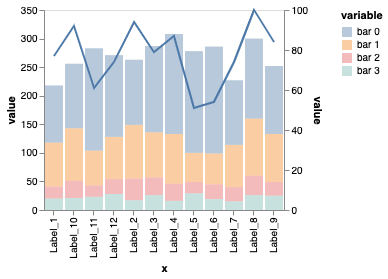

In [85]:
print("=== benchmark 1")
print("# input-table")
display(df_t1)
print("# visualization")
VegaLite(chart_t1, df_t1)

=== benchmark 2
# input-table


,Country,variable,value,l1,l2
0,Spain,1_1,0.306,1,1
1,France,1_1,0.233,1,1
2,US,1_1,0.185,1,1
3,Greece,1_1,0.323,1,1
4,Belgium,1_1,0.329,1,1
5,Costa Rica,1_1,0.366,1,1
6,Germany,1_1,0.086,1,1
7,Switzerland,1_1,0.520,1,1
8,Austria,1_1,0.477,1,1
9,Spain,1_2,0.331,1,2


# visualization


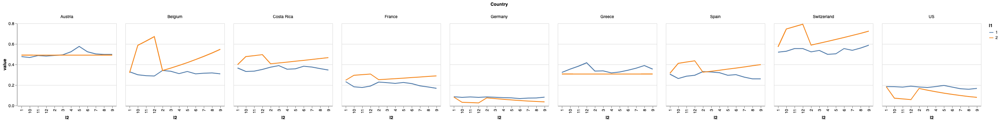

In [86]:
print("=== benchmark 2")
print("# input-table")
display(df_t2)
print("# visualization")
display(VegaLite(chart_t2, df_t2))

=== benchmark 3
# input-table


,data,id,diff
0,16,0,False
1,14,1,False
2,12,2,False
3,13,3,True
4,12,4,False
5,16,5,True
6,18,6,True
7,17,7,False
8,12,8,False
9,18,9,True


# visualization


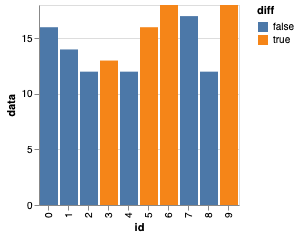

In [87]:

print("=== benchmark 3")
print("# input-table")
display(df_t3)
print("# visualization")
display(VegaLite(chart_t3, df_t3))

=== benchmark 4
# input-table


,Period,variable,value
0,1,APPRENTICE,8.8
1,2,APPRENTICE,4.2
2,3,APPRENTICE,1.0
3,4,APPRENTICE,1.0
4,5,APPRENTICE,0.0
5,6,APPRENTICE,0.0
6,7,APPRENTICE,0.0
7,8,APPRENTICE,0.0
8,9,APPRENTICE,0.0
9,10,APPRENTICE,0.0


# visualization


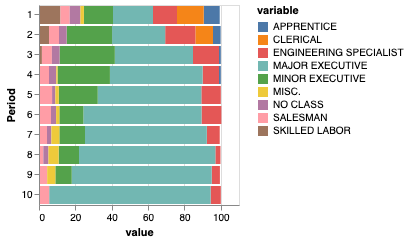

In [88]:

print("=== benchmark 4")
print("# input-table")
display(df_t4)
print("# visualization")
display(VegaLite(chart_t4, df_t4))

=== benchmark 5
# input-table


,id,variable,value
0,1,cat 1,49554
1,2,cat 1,15787
2,3,cat 1,2525
3,4,cat 1,1678
4,5,cat 1,1514
5,6,cat 1,987
6,7,cat 1,574
7,8,cat 1,-331
8,9,cat 1,-7652
9,10,cat 1,-11234


# visualization


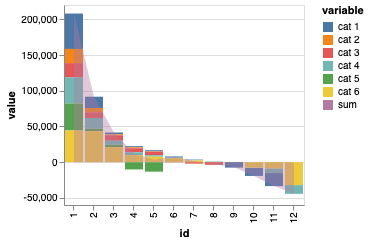

In [89]:

print("=== benchmark 5")
print("# input-table")
display(df_t5)
print("# visualization")
display(VegaLite(chart_t5, df_t5))

=== benchmark 6
# input-table


,time,Passengers,Station,variable,value
0,5:00,12,Deák tér - Bajcsi-Zsilinszky út,500,12
1,6:00,212,Deák tér - Bajcsi-Zsilinszky út,500,212
2,7:00,530,Deák tér - Bajcsi-Zsilinszky út,500,530
3,8:00,1578,Deák tér - Bajcsi-Zsilinszky út,500,1578
4,9:00,1662,Deák tér - Bajcsi-Zsilinszky út,500,1662
5,10:00,1214,Deák tér - Bajcsi-Zsilinszky út,500,1214
6,11:00,1049,Deák tér - Bajcsi-Zsilinszky út,500,1049
7,12:00,988,Deák tér - Bajcsi-Zsilinszky út,500,988
8,13:00,1012,Deák tér - Bajcsi-Zsilinszky út,500,1012
9,14:00,1187,Deák tér - Bajcsi-Zsilinszky út,500,1187


# visualization


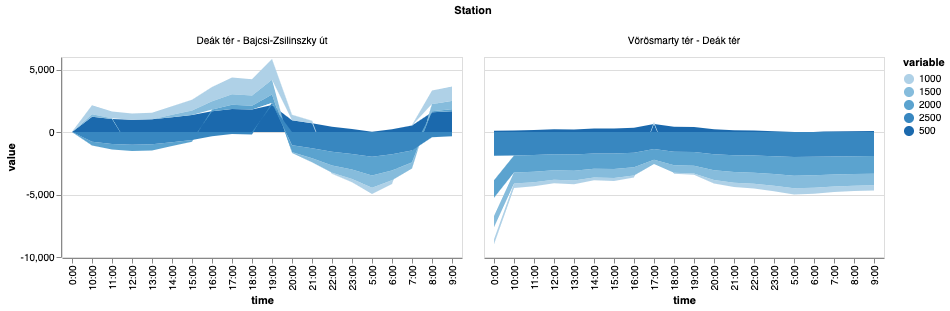

In [90]:

print("=== benchmark 6")
print("# input-table")
display(df_t6)
print("# visualization")
display(VegaLite(chart_t6, df_t6))

=== benchmark 7
# input-table


,category,name,priority,sport,highlight
0,Freshman,Mister_1,1,Basket,False
1,Freshman,Mister_3,1,Basket,False
2,Freshman,Mister_4,1,Basket,False
3,Freshman,Mister_5,1,Climbing,False
4,Freshman,Mister_6,1,Climbing,False
5,Freshman,Mister_7,1,Climbing,False
6,Freshman,Mister_6,2,Fencing,False
7,Freshman,Mister_7,2,Fencing,False
8,Freshman,Mister_2,1,Football,False
9,Freshman,Mister_1,2,Football,False


# visualization


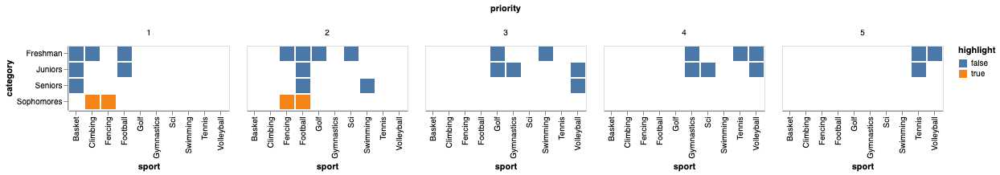

In [91]:
print("=== benchmark 7")
print("# input-table")
display(df_t7)
print("# visualization")
display(VegaLite(chart_t7, df_t7))

=== benchmark 8
# input-table


,ageFrom,ageTo,id,qt,range,label
0,0,10,valore1,5,10,0_10
1,10,15,valore2,12,5,10_15
2,15,30,valore3,74,15,15_30
3,30,40,valore4,12,10,30_40
4,40,99,valore5,8,59,40_99
5,99,120,valore6,15,21,99_120


# visualization


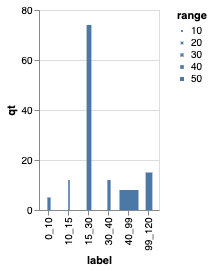

In [92]:
print("=== benchmark 8")
print("# input-table")
display(df_t8)
print("# visualization")
display(VegaLite(chart_t8, df_t8))

=== benchmark 9
# input-table


,Group,Venditor,variable,value
0,Group_1,Vendor_1,2010-1,813
1,Group_1,Vendor_2,2010-1,242
2,Group_1,Vendor_3,2010-1,258
3,Group_2,Vendor_4,2010-1,903
4,Group_2,Vendor_5,2010-1,339
5,Group_2,Vendor_6,2010-1,311
6,Group_2,Vendor_7,2010-1,338
7,Group_3,Vendor_8,2010-1,706
8,Group_3,Vendor_9,2010-1,573
9,Group_3,Vendor_10,2010-1,494


# visualization


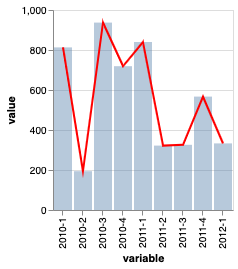

In [93]:
print("=== benchmark 9")
print("# input-table")
display(df_t9)
print("# visualization")
display(VegaLite(chart_t9, df_t9))

=== benchmark 10
# input-table


,Group,Venditor,variable,value,label
0,Group_1,Vendor_1,2010-1,813,Group_1_Vendor_1
1,Group_1,Vendor_2,2010-1,242,Group_1_Vendor_2
2,Group_1,Vendor_3,2010-1,258,Group_1_Vendor_3
3,Group_2,Vendor_4,2010-1,903,Group_2_Vendor_4
4,Group_2,Vendor_5,2010-1,339,Group_2_Vendor_5
5,Group_2,Vendor_6,2010-1,311,Group_2_Vendor_6
6,Group_2,Vendor_7,2010-1,338,Group_2_Vendor_7
7,Group_3,Vendor_8,2010-1,706,Group_3_Vendor_8
8,Group_3,Vendor_9,2010-1,573,Group_3_Vendor_9
9,Group_3,Vendor_10,2010-1,494,Group_3_Vendor_10


# visualization


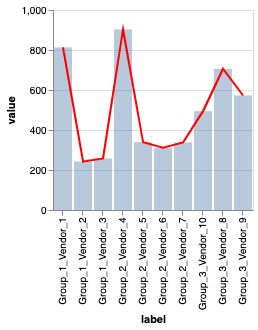

In [94]:
print("=== benchmark 10")
print("# input-table")
display(df_t10)
print("# visualization")
display(VegaLite(chart_t10, df_t10))

=== benchmark 11
# input-table


,Group,Venditor,variable,value,cumsum
0,Group_1,Vendor_1,2010-1,813,813
1,Group_1,Vendor_1,2010-2,194,1007
2,Group_1,Vendor_1,2010-3,937,1944
3,Group_1,Vendor_1,2010-4,719,2663
4,Group_1,Vendor_1,2011-1,840,3503
5,Group_1,Vendor_1,2011-2,322,3825
6,Group_1,Vendor_1,2011-3,326,4151
7,Group_1,Vendor_1,2011-4,567,4718
8,Group_1,Vendor_1,2012-1,333,5051


# visualization


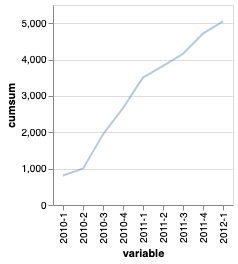

In [95]:
print("=== benchmark 11")
print("# input-table")
display(df_t11)
print("# visualization")
display(VegaLite(chart_t11, df_t11))

=== benchmark 12
# input-table


,Quarter,variable,value
0,Q1,CATEGORIA_1,19
1,Q2,CATEGORIA_1,41
2,Q3,CATEGORIA_1,25
3,Q4,CATEGORIA_1,47
4,Q1,CATEGORIA_2,26
5,Q2,CATEGORIA_2,48
6,Q3,CATEGORIA_2,38
7,Q4,CATEGORIA_2,35
8,Q1,CATEGORIA_3,34
9,Q2,CATEGORIA_3,30


# visualization


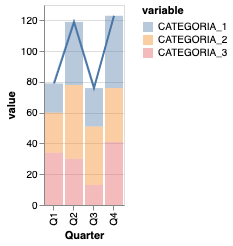

In [96]:
print("=== benchmark 12")
print("# input-table")
display(df_t12)
print("# visualization")
display(VegaLite(chart_t12, df_t12))

=== benchmark 13
# input-table


,Title,year,variable,value,label
0,Financial Accounting Assistant Manager,2003,MS Excel,0,2003_Financial Accounting Assistant Manager
1,Financial Accounting Assistant Manager,2004,MS Excel,1,2004_Financial Accounting Assistant Manager
2,Management Accounting Assistant Manager,2005,MS Excel,2,2005_Management Accounting Assistant Manager
3,Management Accounting Assistant Manager,2006,MS Excel,3,2006_Management Accounting Assistant Manager
4,Indirect Controlling and Reporting Analyst,2007,MS Excel,5,2007_Indirect Controlling and Reporting Analyst
5,Indirect Controlling and Reporting Analyst,2008,MS Excel,6,2008_Indirect Controlling and Reporting Analyst
6,Indirect Controlling and Reporting Analyst,2009,MS Excel,7,2009_Indirect Controlling and Reporting Analyst
7,Indirect Controlling and Reporting Analyst,2010,MS Excel,7,2010_Indirect Controlling and Reporting Analyst
8,Finance Operations Analyst,2011,MS Excel,8,2011_Finance Operations Analyst
9,Finance Operations Analyst,2012,MS Excel,11,2012_Finance Operations Analyst


# visualization


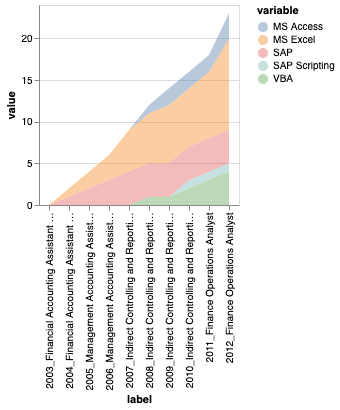

In [97]:
print("=== benchmark 13")
print("# input-table")
display(df_t13)
print("# visualization")
display(VegaLite(chart_t13, df_t13))

=== benchmark 14
# input-table


,title,variable,value
0,Preparing monthly forecast,work,20
1,Margin and Product cost analysis,work,15
2,Excel and Access development,work,10
3,Excel trainings,work,5
4,Beadworks,work,50
5,Sewing,work,0
6,Fiddling with Excel,work,0
7,Managing Excel Hero group on Linked In,work,0
8,Preparing monthly forecast,hobby,0
9,Margin and Product cost analysis,hobby,0


# visualization


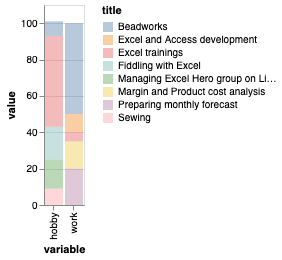

In [98]:
print("=== benchmark 14")
print("# input-table")
display(df_t14)
print("# visualization")
display(VegaLite(chart_t14, df_t14))

=== benchmark 15
# input-table


,Age,variable,value
0,0-18,FEMALE 37%,3
1,18-24,FEMALE 37%,8
2,25-34,FEMALE 37%,13
3,35-44,FEMALE 37%,5
4,24-54,FEMALE 37%,5
5,55+,FEMALE 37%,3
6,0-18,MALE 63%,6
7,18-24,MALE 63%,15
8,25-34,MALE 63%,22
9,35-44,MALE 63%,10


# visualization


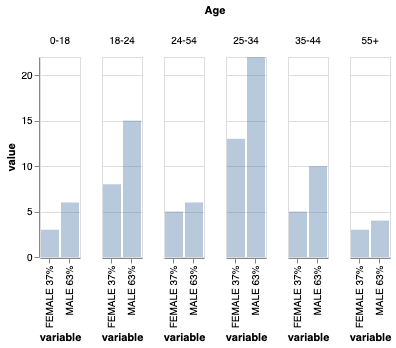

In [99]:
print("=== benchmark 15")
print("# input-table")
display(df_t15)
print("# visualization")
display(VegaLite(chart_t15, df_t15))

=== benchmark 16
# input-table


,label,variable,value
0,lbl_1,mutate_a,85
1,lbl_2,mutate_a,26
2,lbl_3,mutate_a,68
3,lbl_4,mutate_a,93
4,lbl_5,mutate_a,83
5,lbl_6,mutate_a,100
6,lbl_7,mutate_a,89
7,lbl_8,mutate_a,85
8,lbl_9,mutate_a,42
9,lbl_10,mutate_a,62


# visualization


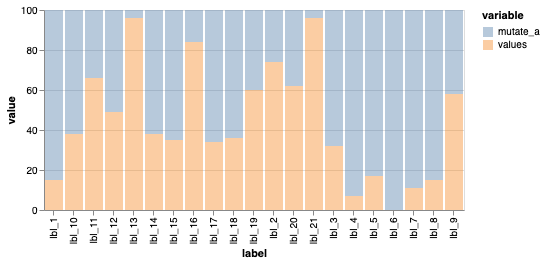

In [100]:
print("=== benchmark 16")
print("# input-table")
display(df_t16)
print("# visualization")
display(VegaLite(chart_t16, df_t16))

=== benchmark 17
# input-table


,From,Total,variable,value
0,YAHOO,100,APPLE,7.6
1,MICROSOFT,100,APPLE,5.0
2,GOOGLE,100,APPLE,0.0
3,APPLE,100,APPLE,0.0
4,LINKEDIN,100,APPLE,1.0
5,FACEBOOK,100,APPLE,0.0
6,YAHOO,100,FACEBOOK,10.5
7,MICROSOFT,100,FACEBOOK,30.5
8,GOOGLE,100,FACEBOOK,15.5
9,APPLE,100,FACEBOOK,11.0


# visualization


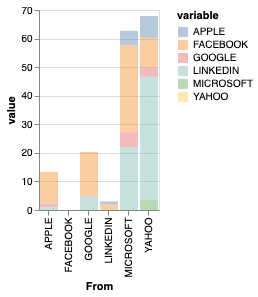

In [101]:
print("=== benchmark 17")
print("# input-table")
display(df_t17)
print("# visualization")
display(VegaLite(chart_t17, df_t17))

=== benchmark 18
# input-table


,label,variable,value
0,1,int x1,0.00
1,2,int x1,0.00
2,3,int x1,25.93
3,4,int x1,26.33
4,5,int x1,27.08
5,6,int x1,28.53
6,7,int x1,0.00
7,8,int x1,0.00
8,1,int x2,0.00
9,2,int x2,24.21


# visualization


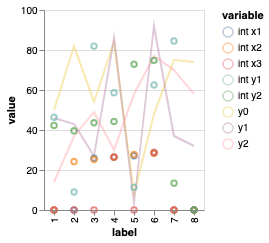

In [102]:
print("=== benchmark 18")
print("# input-table")
display(df_t18)
print("# visualization")
display(VegaLite(chart_t18, df_t18))

=== benchmark 19
# input-table


,Country Name,Region,variable,value
78,Argentina,Latin America and Caribbean,1960,68.10
79,Aruba,Latin America and Caribbean,1960,67.12
80,"Bahamas, The",Latin America and Caribbean,1960,65.62
81,Barbados,Latin America and Caribbean,1960,66.94
82,Belize,Latin America and Caribbean,1960,62.01
83,Bolivia,Latin America and Caribbean,1960,44.77
84,Brazil,Latin America and Caribbean,1960,56.41
85,Chile,Latin America and Caribbean,1960,59.73
86,Colombia,Latin America and Caribbean,1960,58.45
87,Costa Rica,Latin America and Caribbean,1960,63.03


# visualization


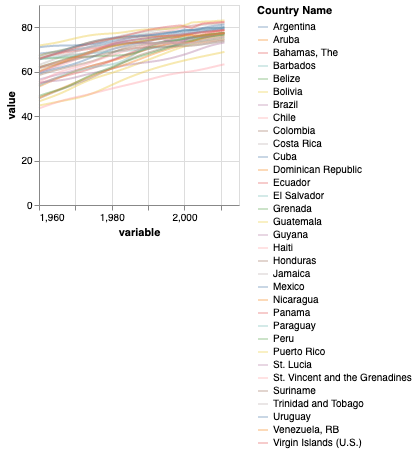

In [103]:
print("=== benchmark 19")
print("# input-table")
display(df_t20)
print("# visualization")
display(VegaLite(chart_t20, df_t20))

=== benchmark 20
# input-table


,prod,year,variable,value
0,Product1,2011,Q1,10
1,Product2,2011,Q1,2
2,Product3,2011,Q1,7
3,Product4,2011,Q1,1
4,Product5,2011,Q1,6
5,Product6,2011,Q1,1
6,Product1,2012,Q1,4
7,Product2,2012,Q1,4
8,Product3,2012,Q1,4
9,Product4,2012,Q1,1


# visualization


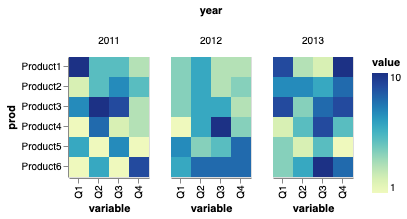

In [104]:
print("=== benchmark 20")
print("# input-table")
display(df_t22)
print("# visualization")
display(VegaLite(chart_t22, df_t22))

=== benchmark 21
# input-table


,Actual Profits,Number of Units,Quarter
0,3358,23,Quarter1
1,3829,27,Quarter2
2,2374,15,Quarter3
3,3373,43,Quarter4


# visualization


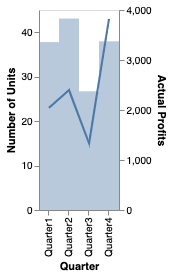

In [105]:
print("=== benchmark 21")
print("# input-table")
display(df1)
print("# visualization")
display(VegaLite(chart1, df1))

=== benchmark 22
# input-table


,Month,variable,value
0,Apr-15,Low (<50%},50.0
1,May-15,Low (<50%},50.0
2,Jun-15,Low (<50%},50.0
3,Jul-15,Low (<50%},50.0
4,Aug-15,Low (<50%},50.0
5,Sep-15,Low (<50%},50.0
6,Oct-15,Low (<50%},50.0
7,Nov-15,Low (<50%},50.0
8,Dec-15,Low (<50%},50.0
9,Jan-16,Low (<50%},50.0


# visualization


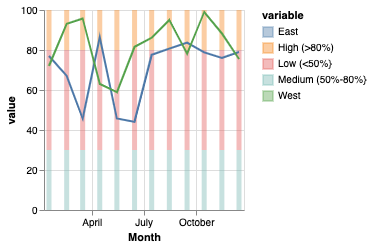

In [106]:
print("=== benchmark 22")
print("# input-table")
display(df2)
print("# visualization")
display(VegaLite(chart2, df2))


=== benchmark 23
# input-table


,Month,Net Cash Flow,Net Cash Flow Sum,c
0,Start,80000,80000,0
1,Apr,-5003,74997,80000
2,May,-16700,58297,74997
3,Jun,48802,107099,58297
4,Jul,-11198,95901,107099
5,Aug,-35260,60641,95901
6,Sep,18220,78861,60641
7,Oct,-23840,55021,78861
8,Nov,43250,98271,55021
9,Dec,-18280,79991,98271


# visualization


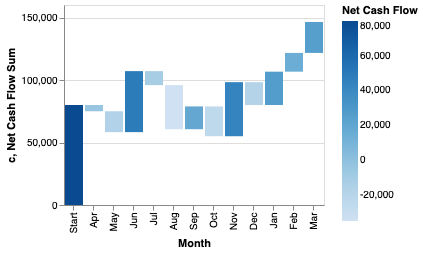

In [107]:
print("=== benchmark 23")
print("# input-table")
display(df3)
print("# visualization")
display(VegaLite(chart3, df3))

=== benchmark 24
# input-table


,Age Group,variable,value,gender,year
0,00-04,Female-1986,8243,Female,1986
1,05-09,Female-1986,8440,Female,1986
2,10-14,Female-1986,8659,Female,1986
3,15-19,Female-1986,8588,Female,1986
4,20-24,Female-1986,7930,Female,1986
5,25-29,Female-1986,7413,Female,1986
6,30-34,Female-1986,6759,Female,1986
7,35-39,Female-1986,5815,Female,1986
8,40-44,Female-1986,4926,Female,1986
9,45-49,Female-1986,4062,Female,1986


# visualization


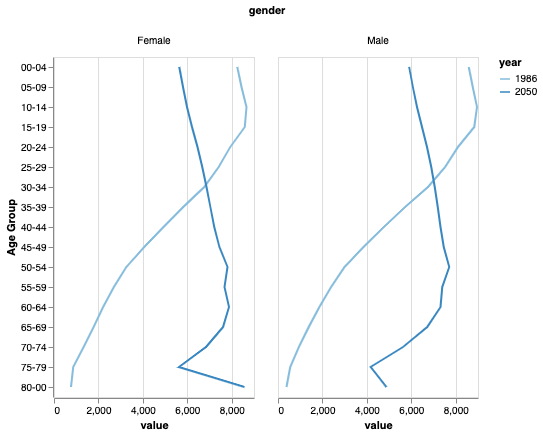

In [108]:
print("=== benchmark 24")
print("# input-table")
display(df4)
print("# visualization")
display(VegaLite(chart4, df4))

=== benchmark 25
# input-table


,Month,variable,value
0,Jan,Cost,6.00
1,Feb,Cost,15.00
2,Mar,Cost,24.00
3,Apr,Cost,33.00
4,May,Cost,42.00
5,Jun,Cost,51.00
6,Jan,Profit,4.00
7,Feb,Profit,5.00
8,Mar,Profit,6.00
9,Apr,Profit,7.00


# visualization


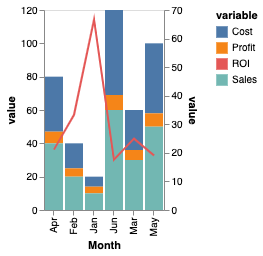

In [109]:
print("=== benchmark 25")
print("# input-table")
display(df5)
print("# visualization")
display(VegaLite(chart5, df5))

=== benchmark 26
# input-table


,Bucket,variable,value
0,Bucket E,Actual,115
1,Bucket D,Actual,90
2,Bucket C,Actual,115
3,Bucket B,Actual,140
4,Bucket A,Actual,150
5,Bucket E,Budgeted,100
6,Bucket D,Budgeted,100
7,Bucket C,Budgeted,125
8,Bucket B,Budgeted,125
9,Bucket A,Budgeted,140


# visualization


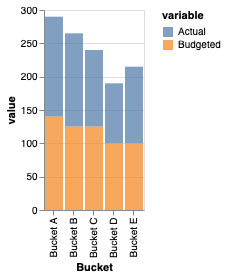

In [110]:
print("=== benchmark 26")
print("# input-table")
display(df6)
print("# visualization")
display(VegaLite(chart6, df6))

=== benchmark 27
# input-table


,id,variable,value
0,0,Strongly Disagree,7.0
1,1,Strongly Disagree,10.0
2,2,Strongly Disagree,10.0
3,0,Agree,35.0
4,1,Agree,10.0
5,2,Agree,30.0
6,0,Disagree,8.0
7,1,Disagree,10.0
8,2,Disagree,15.0
9,0,Strongly Agree,50.0


# visualization


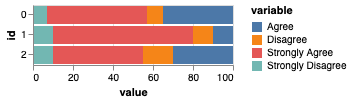

In [111]:
print("=== benchmark 27")
print("# input-table")
display(df7)
print("# visualization")
display(VegaLite(chart7, df7))

=== benchmark 28
# input-table


Value,variable,lower range,means,stddev,upper range
0,Y1,0.39,0.52,0.1328,0.66
1,Y2,0.44,0.57,0.1321,0.70
2,Y3,0.47,0.60,0.1303,0.73
3,Y4,0.50,0.63,0.1266,0.75
4,Y5,0.51,0.63,0.1225,0.75


# visualization


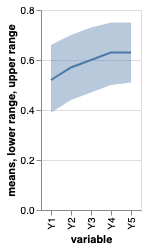

In [112]:
print("=== benchmark 28")
print("# input-table")
display(df8)
print("# visualization")
display(VegaLite(chart8, df8))

=== benchmark 29
# input-table


,Location,Rae,variable,value
0,United States,White,2009,13.3
1,United States,Black or African American,2009,18.1
2,United States,American Indian or Alaska Native,2009,29.2
3,United States,Asian,2009,14.8
4,United States,Native Hawaiian or Pacific Islander,2009,17.3
5,United States,Other Race,2009,34.1
6,United States,Two or more races,2009,14.5
7,United States,"White,not Hispanic or Latino",2009,10.7
8,United States,Hispanic or Latino,2009,31.0
9,Arizona,White,2009,16.3


# visualization


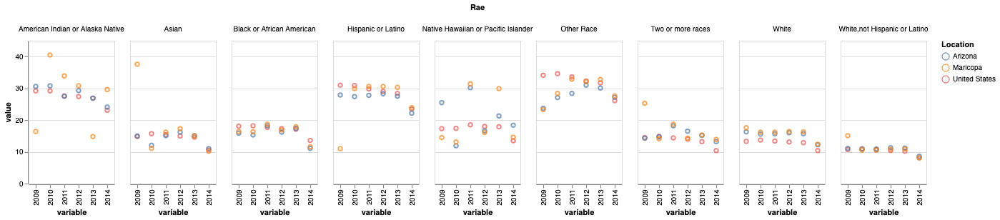

In [113]:

print("=== benchmark 29")
print("# input-table")
display(df9)
print("# visualization")
display(VegaLite(chart9, df9))

=== benchmark 30
# input-table


,Class,variable,value
0,Literacy,Fall,34
1,Language,Fall,63
2,Math,Fall,67
3,Science,Fall,92
4,Arts,Fall,96
5,Literacy,Spring,69
6,Language,Spring,77
7,Math,Spring,75
8,Science,Spring,98
9,Arts,Spring,100


# visualization


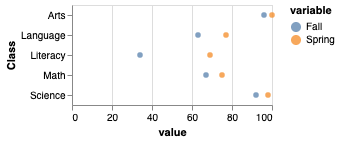

In [114]:

print("=== benchmark 30")
print("# input-table")
display(df10)
print("# visualization")
display(VegaLite(chart10, df10))

=== benchmark 31
# input-table


,C1,C2,variable,value
0,Q1,Targeted,EMEA,66
1,Q1,Engaged,EMEA,65
2,Q1,Pitched,EMEA,59
3,Q1,Adopted,EMEA,52
4,Q2,Targeted,EMEA,56
5,Q2,Engaged,EMEA,54
6,Q2,Pitched,EMEA,50
7,Q2,Adopted,EMEA,42
8,Q3,Targeted,EMEA,91
9,Q3,Engaged,EMEA,78


# visualization


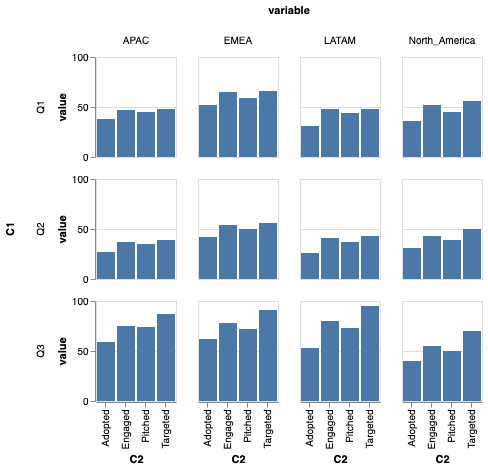

In [115]:

print("=== benchmark 31")
print("# input-table")
display(df11)
print("# visualization")
display(VegaLite(chart11, df11))

=== benchmark 32
# input-table


,C1,C2,variable,value
0,Q1,Targeted,EMEA,66
1,Q1,Engaged,EMEA,65
2,Q1,Pitched,EMEA,59
3,Q1,Adopted,EMEA,52
4,Q2,Targeted,EMEA,56
5,Q2,Engaged,EMEA,54
6,Q2,Pitched,EMEA,50
7,Q2,Adopted,EMEA,42
8,Q3,Targeted,EMEA,91
9,Q3,Engaged,EMEA,78


# visualization


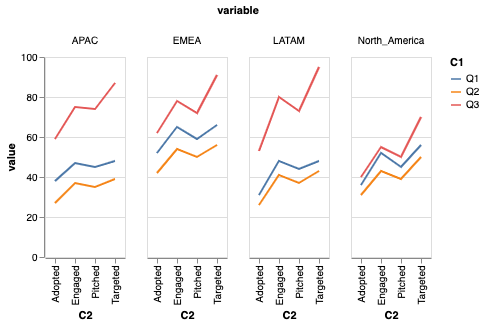

In [116]:

print("=== benchmark 32")
print("# input-table")
display(df12)
print("# visualization")
display(VegaLite(chart12, df12))

=== benchmark 33
# input-table


,Totals,Value,variable,value,cumsum
0,7,A,alpha,2,2
1,8,B,alpha,2,2
2,9,C,alpha,3,3
3,9,D,alpha,3,3
4,9,E,alpha,4,4
5,7,A,beta,2,4
6,8,B,beta,3,5
7,9,C,beta,3,6
8,9,D,beta,4,7
9,9,E,beta,3,7


# visualization


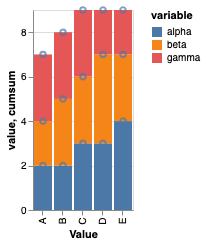

In [117]:
print("=== benchmark 33")
print("# input-table")
display(df13)
print("# visualization")
display(VegaLite(chart13, df13))


=== benchmark 34
# input-table


,Duration,End of Shift,Period,Shift,Start of Shift,s1,s0
0,60,110 / 1090,1,1,50 / 1150,110,50
1,48,272 / 928,1,2,224 / 976,272,224
2,40,419 / 781,1,3,379 / 821,419,379
3,56,601 / 599,1,4,545 / 655,601,545
4,81,840 / 360,1,5,759 / 441,840,759
5,48,1014 / 186,1,6,966 / 234,1014,966
6,62,1146 / 54,1,7,1084 / 116,1146,1084
7,60,60 / 1140,2,8,0 / 1200,60,0
8,88,245 / 955,2,9,157 / 1043,245,157
9,46,604 / 596,2,10,558 / 642,604,558


# visualization


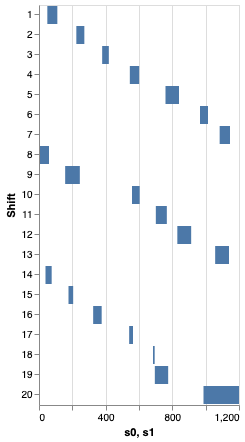

In [118]:
print("=== benchmark 34")
print("# input-table")
display(df14)
print("# visualization")
display(VegaLite(chart14, df14))

=== benchmark 35
# input-table


,Duration,End of Shift,Period,Shift,Start of Shift,s1,s0
0,60,110 / 1090,1,1,50 / 1150,110,50
1,48,272 / 928,1,2,224 / 976,272,224
2,40,419 / 781,1,3,379 / 821,419,379
3,56,601 / 599,1,4,545 / 655,601,545
4,81,840 / 360,1,5,759 / 441,840,759
5,48,1014 / 186,1,6,966 / 234,1014,966
6,62,1146 / 54,1,7,1084 / 116,1146,1084
7,60,60 / 1140,2,8,0 / 1200,60,0
8,88,245 / 955,2,9,157 / 1043,245,157
9,46,604 / 596,2,10,558 / 642,604,558


# visualization


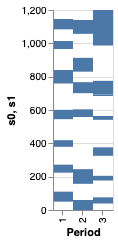

In [119]:
print("=== benchmark 35")
print("# input-table")
display(df15)
print("# visualization")
display(VegaLite(chart15, df15))

=== benchmark 36
# input-table


,Amount,Revenue,Variance,Variance %,Year,Year Label,c
0,773000,$773K,39000,+5%,2011,2011,812000
1,812000,$812K,-445000,-55%,2012,2012,367000
2,367000,$367K,117000,+32%,2013,2013,484000
3,484000,$484K,278000,+57%,2014,2014,762000
4,762000,$762K,-201000,-26%,2015,2015,561000
5,561000,$561K,213000,+38%,2016,2016,774000
6,774000,$774K,14500,,2017,2017,788500


# visualization


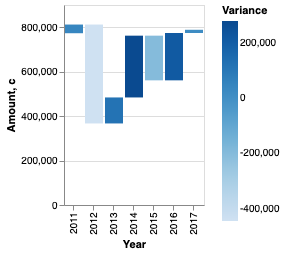

In [120]:
print("=== benchmark 36")
print("# input-table")
display(df16)
print("# visualization")
display(VegaLite(chart16, df16))

=== benchmark 37
# input-table


,Year,variable,value
0,2001,Actual,1000
1,2002,Actual,1050
2,2003,Actual,1110
3,2004,Actual,1180
4,2005,Actual,1260
5,2006,Actual,1350
6,2007,Actual,1450
7,2008,Actual,1560
8,2009,Actual,1680
9,2010,Actual,1810


# visualization


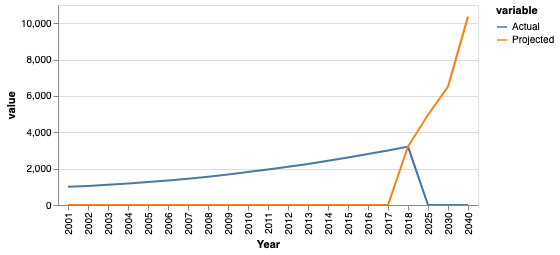

In [121]:
print("=== benchmark 37")
print("# input-table")
display(df17)
print("# visualization")
display(VegaLite(chart17, df17))

=== benchmark 38
# input-table


,Item,variable,value
0,Desktop Computers,2012,20
1,Laptops,2012,34
2,Monitors,2012,12
3,Printers,2012,78
4,Desktop Computers,2013,12
5,Laptops,2013,45
6,Monitors,2013,10
7,Printers,2013,13
8,Desktop Computers,2014,13
9,Laptops,2014,40


# visualization


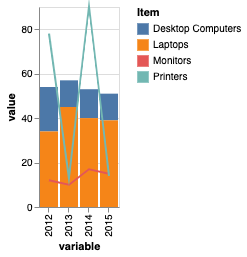

In [122]:
print("=== benchmark 38")
print("# input-table")
display(df18)
print("# visualization")
display(VegaLite(chart18, df18))

=== benchmark 39
# input-table


,cuts,Customer ID,Duration,Purchase Amount,Representative,csum
0,"(0,10]",533,533,533,533,533
1,"(10,20]",0,0,0,0,533
2,"(20,30]",0,0,0,0,533
3,"(30,40]",0,0,0,0,533
4,"(40,50]",72,72,72,72,605
5,"(50,60]",118,118,118,118,723
6,"(60,70]",127,127,127,127,850
7,"(70,80]",126,126,126,126,976
8,"(80,90]",123,123,123,123,1099
9,"(90,100]",113,113,113,113,1212


# visualization


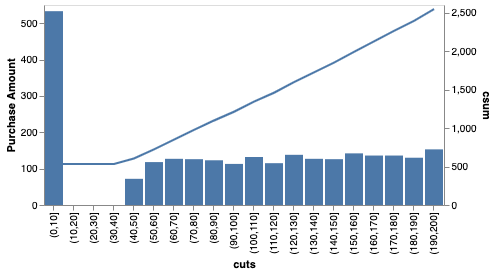

In [123]:
print("=== benchmark 39")
print("# input-table")
display(df19)
print("# visualization")
display(VegaLite(chart19, df19))

=== benchmark 40
# input-table


,Product,Country,Amount
0,Apple,Australia,20634
1,Apple,Canada,24867
2,Apple,France,80193
3,Apple,Germany,9082
4,Apple,New Zealand,10332
5,Apple,United Kingdom,17534
6,Apple,United States,28615
7,Banana,Australia,52721
8,Banana,Canada,33775
9,Banana,France,36094


# visualization


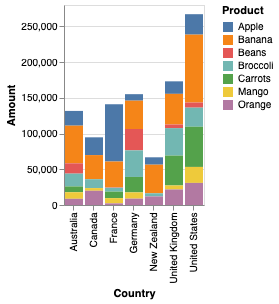

In [124]:
print("=== benchmark 40")
print("# input-table")
display(df20)
print("# visualization")
display(VegaLite(chart20, df20))

=== benchmark 41
# input-table


,Country,Total Result,variable,value
0,Australia,40492,Beans,14433
1,Canada,12407,Beans,0
2,France,15125,Beans,680
3,Germany,88738,Beans,29905
4,New Zealand,4390,Beans,0
5,United Kingdom,85351,Beans,5100
6,United States,90162,Beans,7163
8,Australia,40492,Broccoli,17953
9,Canada,12407,Broccoli,12407
10,France,15125,Broccoli,5341


# visualization


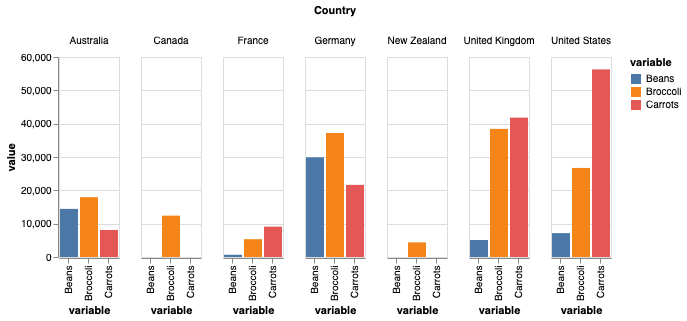

In [125]:
print("=== benchmark 41")
print("# input-table")
display(df21)
print("# visualization")
display(VegaLite(chart21, df21))

=== benchmark 42
# input-table


,label,variable,value
0,Category 1,2008,61
1,Category 2,2008,128
2,Category 3,2008,12
3,Category 4,2008,93
4,Category 5,2008,88
5,Category 6,2008,22
6,Category 1,2009,70
7,Category 2,2009,22
8,Category 3,2009,95
9,Category 4,2009,24


# visualization


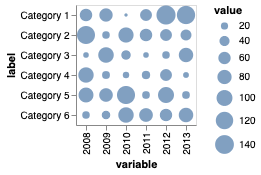

In [126]:
print("=== benchmark 42")
print("# input-table")
display(df22)
print("# visualization")
display(VegaLite(chart22, df22))

=== benchmark 43
# input-table


,data_ora,site,type,value,day,hour
0,6_0,e90e50,computer,22,6,0
1,6_0,e90e50,mobile,8,6,0
2,6_0,e90e50fx,computer,17,6,0
3,6_0,e90e50fx,mobile,5,6,0
4,6_1,e90e50,computer,8,6,1
5,6_1,e90e50,mobile,7,6,1
6,6_1,e90e50fx,computer,22,6,1
7,6_1,e90e50fx,mobile,6,6,1
8,6_2,e90e50,computer,18,6,2
9,6_2,e90e50,mobile,5,6,2


# visualization


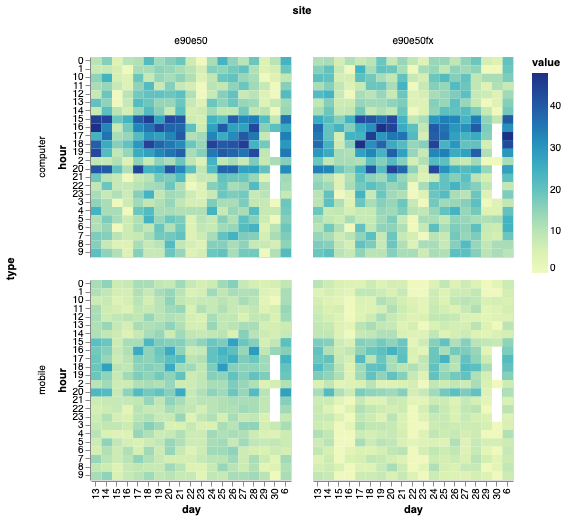

In [127]:
print("=== benchmark 43")
print("# input-table")
display(df23)
print("# visualization")
display(VegaLite(chart23, df23))

=== benchmark 44
# input-table


,Duration,Parts,Start Date,End Date
0,864000,Foundation,959842800,960706800
1,604800,Walls,960793200,961398000
2,864000,Roof,961484400,962348400
3,432000,"Windows, Doors",962434800,962866800
4,259200,Plumbing,962953200,963212400
5,259200,Electric,962953200,963212400
6,172800,Painting,963298800,963471600
7,172800,Flooring,963471600,963644400


# visualization


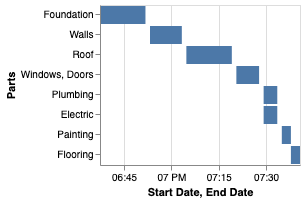

In [128]:
print("=== benchmark 44")
print("# input-table")
display(df24)
print("# visualization")
display(VegaLite(chart24, df24))

=== benchmark 45
# input-table


,Complaint Type,Count,cumsum
0,Too noisy,27,27
1,Overpriced,789,816
2,Food is tasteless,65,881
3,Food not fresh,9,890
4,Food is too salty,15,905
5,Not clean,30,935
6,Unfriendly staff,12,947
7,Wait time,109,1056
8,No atmosphere,45,1101
9,Small portions,621,1722


# visualization


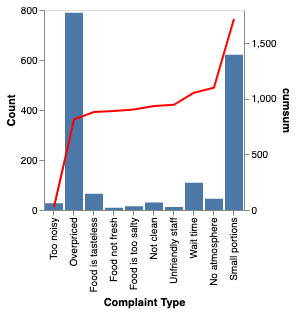

In [129]:
print("=== benchmark 45")
print("# input-table")
display(df25)
print("# visualization")
display(VegaLite(chart25, df25))

=== benchmark 46
# input-table


,day,hour,value
0,06,00,155
1,06,01,149
2,06,02,156
3,06,03,149
4,06,04,139
5,06,05,140
6,06,06,157
7,06,07,156
8,06,08,135
9,06,09,144


# visualization


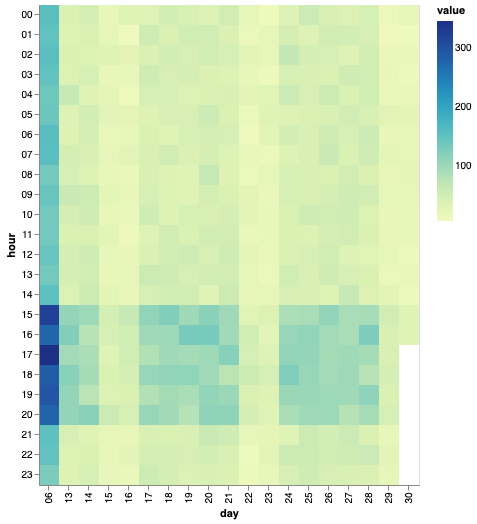

In [130]:
print("=== benchmark 46")
print("# input-table")
display(df26)
print("# visualization")
display(VegaLite(chart26, df26))

=== benchmark 47
# input-table


,Period,variable,value
0,Actual,00,120.0
1,Interval = 2,00,0.0
2,Interval = 4,00,0.0
3,Interval = 6,00,0.0
4,Actual,01,150.0
5,Interval = 2,01,135.0
6,Interval = 4,01,0.0
7,Interval = 6,01,0.0
8,Actual,02,240.0
9,Interval = 2,02,195.0


# visualization


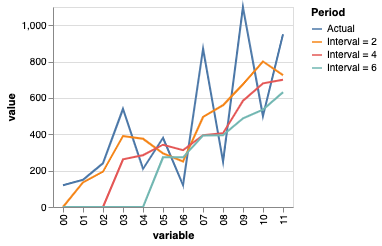

In [131]:
print("=== benchmark 47")
print("# input-table")
display(df27)
print("# visualization")
display(VegaLite(chart27, df27))

=== benchmark 48
# input-table


,cuts,Number of students
0,"(19,26]",9
1,"(26,32]",3
2,"(32,39]",2
3,"(39,45]",2
4,"(45,52]",2


# visualization


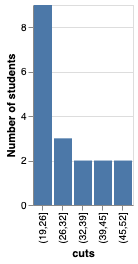

In [132]:
print("=== benchmark 48")
print("# input-table")
display(df28)
print("# visualization")
display(VegaLite(chart28, df28))

=== benchmark 49
# input-table


,Sport,Rank,variable,value,Archery
0,Archery,55,Endurance,2.88,True
1,Auto Racing,32,Endurance,5.88,False
2,Badminton,30,Endurance,5.25,False
3,Baseball/Softball,9,Endurance,4.63,False
4,Basketball,4,Endurance,7.38,False
5,Billiards,59,Endurance,1.00,False
6,Bobsledding/Luge,28,Endurance,3.50,False
7,Bowling,57,Endurance,2.25,False
8,Boxing,1,Endurance,8.63,False
9,Canoe/Kayak,49,Endurance,6.75,False


# visualization


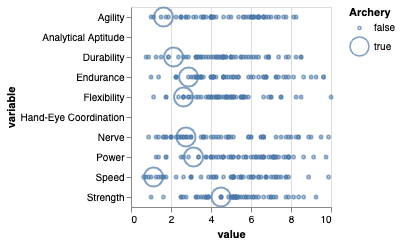

In [133]:
print("=== benchmark 49")
print("# input-table")
display(df29)
print("# visualization")
display(VegaLite(chart29, df29))

=== benchmark 50
# input-table


,Sport,Rank,variable,value,Archery
0,Archery,55,Endurance,2.88,True
1,Auto Racing,32,Endurance,5.88,False
2,Badminton,30,Endurance,5.25,False
3,Baseball/Softball,9,Endurance,4.63,False
4,Basketball,4,Endurance,7.38,False
5,Billiards,59,Endurance,1.00,False
6,Bobsledding/Luge,28,Endurance,3.50,False
7,Bowling,57,Endurance,2.25,False
8,Boxing,1,Endurance,8.63,False
9,Canoe/Kayak,49,Endurance,6.75,False


# visualization


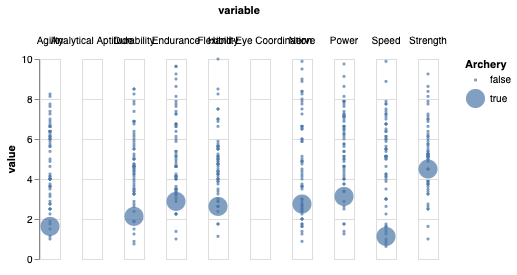

In [134]:
print("=== benchmark 50")
print("# input-table")
display(df30)
print("# visualization")
display(VegaLite(chart30, df30))

=== benchmark 51
# input-table


,Business Group,Emp Num,Group Name,Noise,Performance Rating,Rating 17 (number),Ratings X,Salary Increase $,Total Increase
0,4,11505,Development,-0.152,Successful Performance,3,46.098,0.0,#N/A
1,4,11529,Development,0.079,Successful Performance,3,46.329,1644.0,1644
2,4,11537,Development,0.639,Outstanding Performance,4,49.389,0.0,#N/A
3,4,11538,Development,-0.406,Not Meeting,1,40.844,0.0,#N/A
4,4,11539,Development,-0.222,Achieved Most,2,43.528,0.0,#N/A
5,4,11559,Development,0.521,Successful Performance,3,46.771,822.0,822
6,4,11564,Development,-0.379,Successful Performance,3,45.871,2272.0,2272
7,4,11582,Development,0.633,Successful Performance,3,46.883,4600.0,4600
8,4,11585,Development,0.119,Achieved Most,2,43.869,625.0,625
9,4,11587,Development,0.011,Successful Performance,3,46.261,563.0,563


# visualization


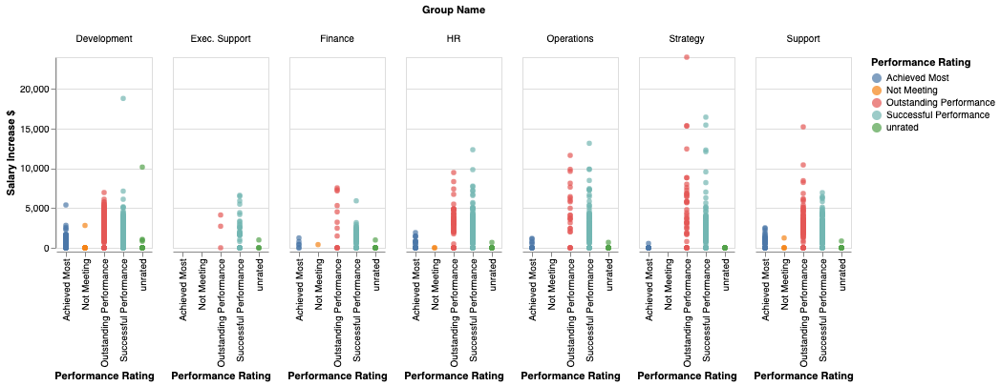

In [135]:
print("=== benchmark 51")
print("# input-table")
display(df31)
print("# visualization")
display(VegaLite(chart31, df31))

=== benchmark 52
# input-table


,id,variable,value
0,0,Serie1_y,63
1,1,Serie1_y,123
2,2,Serie1_y,213
3,3,Serie1_y,234
4,4,Serie1_y,322
5,5,Serie1_y,410
6,6,Serie1_y,473
7,7,Serie1_y,484
8,8,Serie1_y,529
9,9,Serie1_y,543


# visualization


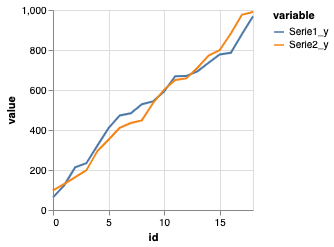

In [136]:
print("=== benchmark 52")
print("# input-table")
display(df32)
print("# visualization")
display(VegaLite(chart32, df32))

=== benchmark 53
# input-table


,Timeline,variable,value
11,Jun-16,Forecast,1097
12,Jul-16,Forecast,939.925
13,Aug-16,Forecast,924.496
14,Sep-16,Forecast,909.067
26,Jun-16,Lower Confidence Bound,1097
27,Jul-16,Lower Confidence Bound,-1913.98
28,Aug-16,Lower Confidence Bound,-1952.33
29,Sep-16,Lower Confidence Bound,-1990.86
41,Jun-16,Upper Confidence Bound,1097
42,Jul-16,Upper Confidence Bound,3793.83


# visualization


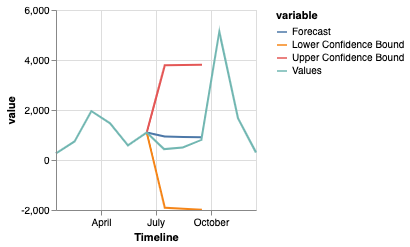

In [137]:
print("=== benchmark 53")
print("# input-table")
display(df34)
print("# visualization")
display(VegaLite(chart34, df34))

=== benchmark 54
# input-table


,DATA,variable,value
0,A,Lower,80
1,B,Lower,103
2,C,Lower,106
3,D,Lower,75
4,E,Lower,85
5,A,Upper,116
6,B,Upper,138
7,C,Upper,157
8,D,Upper,85
9,E,Upper,102


# visualization


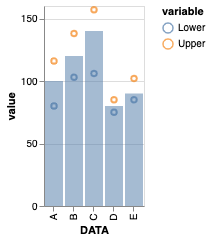

In [138]:
print("=== benchmark 54")
print("# input-table")
display(df35)
print("# visualization")
display(VegaLite(chart35, df35))

=== benchmark 55
# input-table


,Close,Date,variable,value,color
0,7210.770020,1-Jul-05,VolumeDiff,NaN,False
1,7212.080078,4-Jul-05,VolumeDiff,800.0,True
2,7271.540039,11-Jul-05,VolumeDiff,200.0,False
3,7423.250000,18-Jul-05,VolumeDiff,600.0,False
4,7635.419922,25-Jul-05,VolumeDiff,5500.0,True
5,7754.000000,1-Aug-05,VolumeDiff,2400.0,True
6,7767.490234,8-Aug-05,VolumeDiff,1000.0,False
7,7780.759766,16-Aug-05,VolumeDiff,8000.0,False
8,7680.220215,22-Aug-05,VolumeDiff,1300.0,True
9,7899.770020,29-Aug-05,VolumeDiff,2700.0,False


# visualization


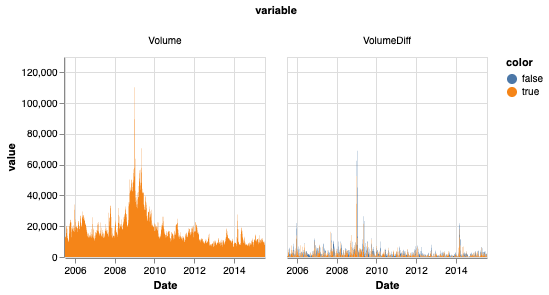

In [139]:
print("=== benchmark 55")
print("# input-table")
display(df36)
print("# visualization")
display(VegaLite(chart36, df36))

=== benchmark 56
# input-table


,TOTAL,Category,variable,value
0,645,HOME APPLIANCES,<-10%,451
1,568,COMPUTERS,<-10%,394
2,355,CAMERAS & CAMCORDERS,<-10%,245
3,265,CELL PHONES,<-10%,185
4,205,TV & VIDEO,<-10%,143
5,166,GAMES & TOYS,<-10%,101
6,100,AUDIO,<-10%,66
7,90,"MUSIC, MOVIES & AUDIO BOOKS",<-10%,75
8,645,HOME APPLIANCES,<0%,506
9,568,COMPUTERS,<0%,450


# visualization


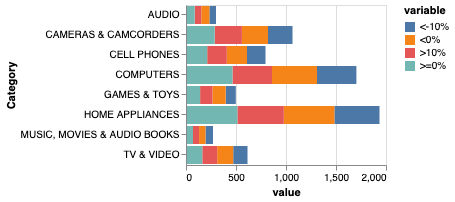

In [140]:
print("=== benchmark 56")
print("# input-table")
display(df37)
print("# visualization")
display(VegaLite(chart37, df37))

=== benchmark 57
# input-table


,x,variable,value
0,1,group1,56
1,2,group1,23
2,3,group1,96
3,4,group1,24
4,5,group1,75
5,6,group1,67
6,7,group1,42
7,8,group1,45
8,1,group2,63
9,2,group2,34


# visualization


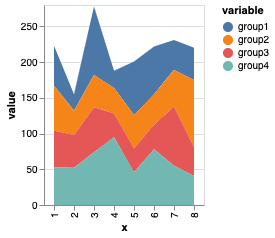

In [141]:
print("=== benchmark 57")
print("# input-table")
display(df38)
print("# visualization")
display(VegaLite(chart38, df38))

=== benchmark 58
# input-table


,Year,loc,Bisc,Choc
0,2007,NORTH,6.0,14.0
1,2007,SOUTH,4.0,10.0
2,2007,WEST,4.0,6.0
3,2008,NORTH,6.7,18.0
4,2008,SOUTH,5.0,11.0
5,2008,WEST,5.0,10.0
6,2009,NORTH,7.0,19.0
7,2009,SOUTH,5.7,14.0
8,2009,WEST,5.7,12.0
9,2010,NORTH,8.0,21.0


# visualization


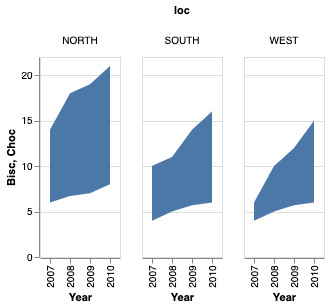

In [142]:
print("=== benchmark 58")
print("# input-table")
display(df39)
print("# visualization")
display(VegaLite(chart39, df39))

=== benchmark 59
# input-table


,Value,Win / Loss,id,end,start
0,10,Win,0,10,0
1,2,Loss,1,12,10
2,12,Win,2,24,12
3,4,Loss,3,28,24
4,5,Win,4,33,28
5,16,Loss,5,49,33
6,9,Win,6,58,49
7,18,Loss,7,76,58
8,12,Win,8,88,76
9,3,Loss,9,91,88


# visualization


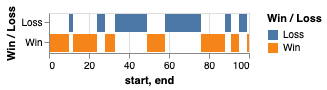

In [143]:
print("=== benchmark 59")
print("# input-table")
display(df40)
print("# visualization")
display(VegaLite(chart40, df40))

=== benchmark 60
# input-table


,Year,variable,value
0,1950,Cod,2716706
1,1951,Cod,3861166
2,1952,Cod,4396174
3,1953,Cod,3901176
4,1954,Cod,4412721
5,1955,Cod,4774045
6,1950,Crustaceans,58578630
7,1951,Crustaceans,59194582
8,1952,Crustaceans,47562941
9,1953,Crustaceans,68432658


# visualization


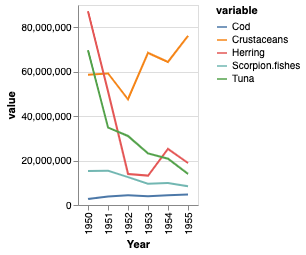

In [144]:
print("=== benchmark 60")
print("# input-table")
display(df41)
print("# visualization")
display(VegaLite(chart41, df41))

=== benchmark 61
# input-table


,date,variable,value
0,2002-01-01,var0,100.0000
1,2002-02-01,var0,87.6560
2,2002-03-01,var0,78.7880
3,2002-04-01,var0,64.8441
4,2002-05-01,var0,83.3027
5,2002-06-01,var0,87.6119
6,2002-07-01,var0,95.3772
7,2002-08-01,var0,90.4327
8,2002-09-01,var0,100.8564
9,2002-10-01,var0,106.3733


# visualization


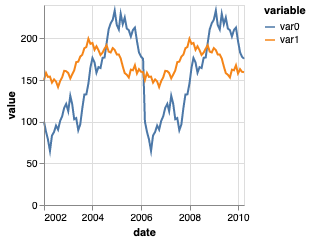

In [145]:
print("=== benchmark 61")
print("# input-table")
display(df42)
print("# visualization")
display(VegaLite(chart42, df42))


=== benchmark 62
# input-table


,variable,value,depth,price,table,x,y,z,carat
0,clarity,I1,3,3,3,3,3,3,3
1,clarity,IF,1,1,1,1,1,1,1
2,clarity,SI1,19,19,19,19,19,19,19
3,clarity,SI2,25,25,25,25,25,25,25
4,clarity,VS1,10,10,10,10,10,10,10
5,clarity,VS2,24,24,24,24,24,24,24
6,clarity,VVS1,8,8,8,8,8,8,8
7,clarity,VVS2,10,10,10,10,10,10,10
8,color,D,11,11,11,11,11,11,11
9,color,E,12,12,12,12,12,12,12


# visualization


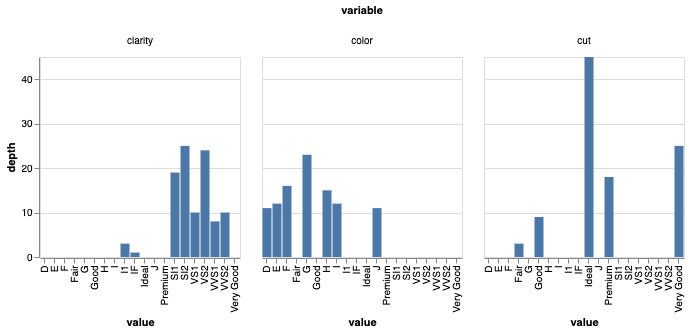

In [146]:
print("=== benchmark 62")
print("# input-table")
display(df43)
print("# visualization")
display(VegaLite(chart43, df43))

=== benchmark 63
# input-table


,Species,variable,value
0,setosa,Petal.Length,722
1,setosa,Petal.Width,123
2,setosa,Sepal.Length,2143
3,setosa,Sepal.Width,1516
4,versicolor,Petal.Length,1878
5,versicolor,Petal.Width,600
6,versicolor,Sepal.Length,2599
7,versicolor,Sepal.Width,1151
8,virginica,Petal.Length,2533
9,virginica,Petal.Width,905


# visualization


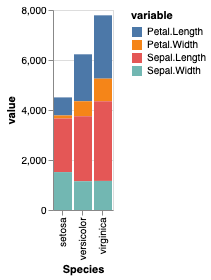

In [147]:
print("=== benchmark 63")
print("# input-table")
display(df44)
print("# visualization")
display(VegaLite(chart44, df44))

=== benchmark 64
# input-table


,X1,variable,value
0,Diversity,B1,5.1
1,Endangerment,B1,4.9
2,Marketability,B1,4.7
3,Total,B1,4.6
4,Diversity,B2,3.5
5,Endangerment,B2,3.0
6,Marketability,B2,3.2
7,Total,B2,3.1
8,Diversity,B3,1.4
9,Endangerment,B3,1.4


# visualization


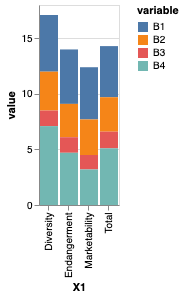

In [148]:
print("=== benchmark 64")
print("# input-table")
display(df45)
print("# visualization")
display(VegaLite(chart45, df45))

=== benchmark 65
# input-table


,date,Y2K,variable,value
0,2012-07-01,False,psavert,6.6
1,2001-09-01,False,psavert,6.3
2,2011-08-01,False,psavert,6.2
3,2005-07-01,False,psavert,1.9
4,1989-05-01,True,psavert,7.6
5,1985-03-01,True,psavert,8.1
6,1989-08-01,True,psavert,7.1
7,2008-11-01,False,psavert,6.3
8,2014-01-01,False,psavert,4.9
9,1987-09-01,True,psavert,7.0


# visualization


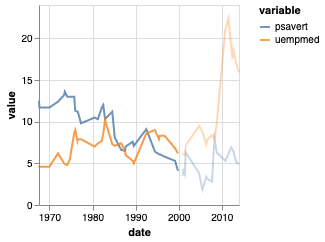

In [149]:
print("=== benchmark 65")
print("# input-table")
display(df46)
print("# visualization")
display(VegaLite(chart46, df46))

=== benchmark 66
# input-table


,label,variable,value
0,Label1,ok,0.0
1,Label2,ok,0.5
2,Label3,ok,0.4
3,Label4,ok,0.9
4,Label5,ok,0.4
5,Label6,ok,0.9
6,Label7,ok,0.8
7,Label8,ok,0.8
8,Label1,mutate_a,1.0
9,Label2,mutate_a,0.5


# visualization


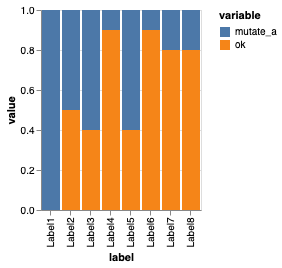

In [150]:
print("=== benchmark 66")
print("# input-table")
display(df47)
print("# visualization")
display(VegaLite(chart47, df47))

=== benchmark 67
# input-table


,category,totalABC,variable,value
0,group1,17,A,15
1,group2,163,A,125
2,group1,17,B,3
3,group2,163,B,48
4,group1,17,C,16
5,group2,163,C,153


# visualization


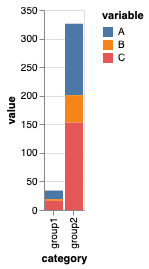

In [151]:
print("=== benchmark 67")
print("# input-table")
display(df48)
print("# visualization")
display(VegaLite(chart48, df48))

=== benchmark 68
# input-table


scenario1,row,drain,measured,simulated
0,0.5,drain,40.0,39.9
1,0.5,nodrain,40.0,41.0
2,0.8,drain,55.0,55.3
3,0.8,nodrain,55.0,56.0
4,adj21,drain,23.0,23.4
5,adj21,nodrain,23.0,22.0
6,adj22,drain,27.0,27.2
7,adj22,nodrain,27.0,27.5
8,raw21,drain,55.0,54.5
9,raw21,nodrain,55.0,54.0


# visualization


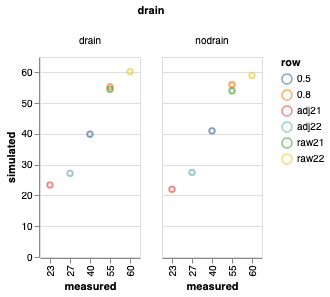

In [152]:
print("=== benchmark 68")
print("# input-table")
display(df49)
print("# visualization")
display(VegaLite(chart49, df49))

=== benchmark 69
# input-table


,id,variable,value
0,0,Consuntivo 2010,42560.0
1,1,Consuntivo 2010,46368.0
2,2,Consuntivo 2010,46826.0
3,3,Consuntivo 2010,53090.0
4,4,Consuntivo 2010,60331.0
5,5,Consuntivo 2010,64501.0
6,6,Consuntivo 2010,69244.0
7,7,Consuntivo 2010,73102.0
8,8,Consuntivo 2010,80000.0
9,9,Consuntivo 2010,83922.0


# visualization


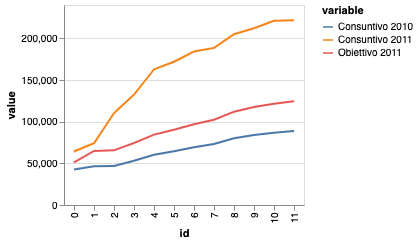

In [153]:
print("=== benchmark 69")
print("# input-table")
display(df50)
print("# visualization")
display(VegaLite(chart50, df50))

=== benchmark 70
# input-table


Feature,Condition,Sex,A,Aneg,p
0,1,F,2,5,7
1,1,M,6,1,7
2,2,F,3,6,9
3,2,M,4,2,6
4,3,F,4,9,13
5,3,M,10,6,16


# visualization


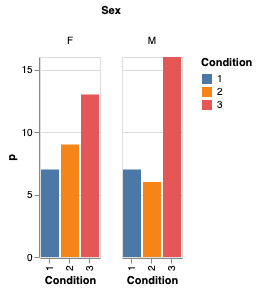

In [154]:
print("=== benchmark 70")
print("# input-table")
display(df51)
print("# visualization")
display(VegaLite(chart51, df51))

=== benchmark 71
# input-table


,Label,variable,value
0,Label_1,bar 0,100
1,Label_2,bar 0,114
2,Label_3,bar 0,151
3,Label_4,bar 0,175
4,Label_5,bar 0,178
5,Label_6,bar 0,187
6,Label_7,bar 0,113
7,Label_8,bar 0,140
8,Label_9,bar 0,119
9,Label_10,bar 0,113


# visualization


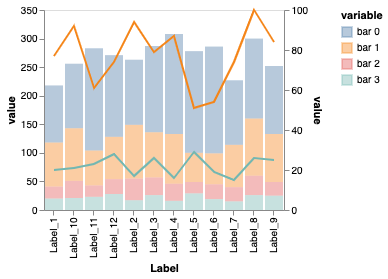

In [155]:
print("=== benchmark 71")
print("# input-table")
display(df52)
print("# visualization")
display(VegaLite(chart52, df52))

=== benchmark 72
# input-table


,classes,date,score
0,english,9/1/11,1
1,english,9/2/11,1
2,english,9/5/11,2
3,french,9/1/11,2
4,french,9/2/11,1
5,french,9/5/11,1
6,spanish,9/1/11,1
7,spanish,9/3/11,2
8,spanish,9/5/11,1


# visualization


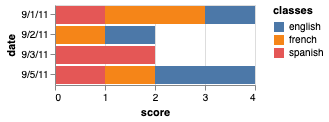

In [156]:

print("=== benchmark 72")
print("# input-table")
display(df53)
print("# visualization")
display(VegaLite(chart53, df53))

=== benchmark 73
# input-table


,h,h_bar,x,y2
0,102,76,Label_1,178
1,124,90,Label_2,214
2,126,76,Label_3,202
3,139,65,Label_4,204
4,177,65,Label_5,242
5,188,84,Label_6,272
6,155,58,Label_7,213
7,138,50,Label_8,188
8,128,92,Label_9,220
9,102,91,Label_10,193


# visualization


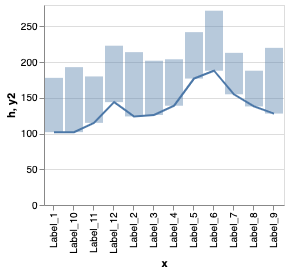

In [157]:

print("=== benchmark 73")
print("# input-table")
display(df54)
print("# visualization")
display(VegaLite(chart54, df54))

=== benchmark 74
# input-table


val1,id,val2,a,b
0,A,c,2,2
1,A,d,4,4
2,B,c,2,5
3,B,d,1,2
4,C,c,3,5
5,C,d,2,4
6,D,c,5,4
7,D,d,1,3


# visualization


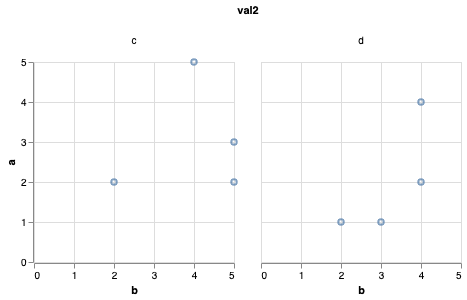

In [158]:
print("=== benchmark 74")
print("# input-table")
display(df55)
print("# visualization")
display(VegaLite(chart55, df55))

=== benchmark 75
# input-table


,grp,time,variable,value
0,A,1,02,36034
1,B,1,02,63763
2,C,1,02,51432
3,D,1,02,65100
4,E,1,02,61444
5,F,1,02,71012
6,A,5,02,266610
7,B,5,02,389787
8,C,5,02,47659
9,D,5,02,63156


# visualization


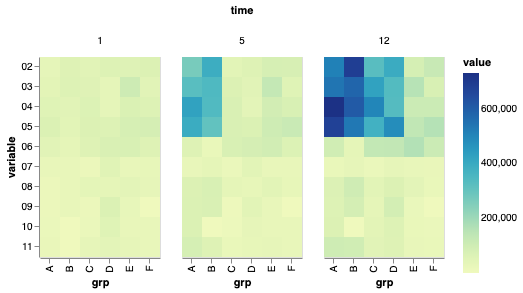

In [159]:
print("=== benchmark 75")
print("# input-table")
display(df56)
print("# visualization")
display(VegaLite(chart56, df56))

=== benchmark 76
# input-table


axis,group,g,x,y
0,1,0,10.0,8.04
1,1,1,8.0,6.95
2,1,2,13.0,7.58
3,1,3,9.0,8.81
4,1,4,11.0,8.33
5,1,5,14.0,9.96
6,1,6,6.0,7.24
7,1,7,4.0,4.26
8,1,8,12.0,10.84
9,1,9,7.0,4.82


# visualization


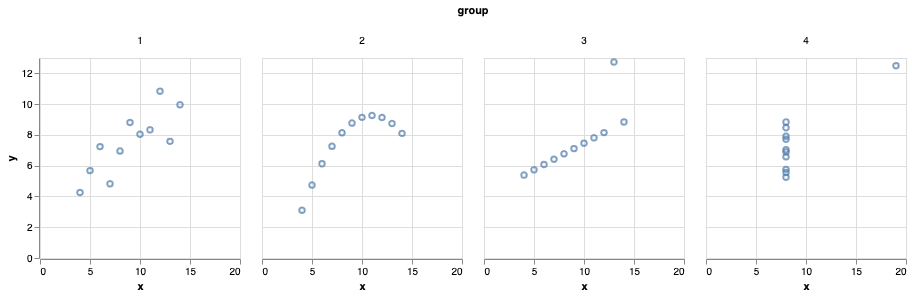

In [160]:
print("=== benchmark 76")
print("# input-table")
display(df57)
print("# visualization")
display(VegaLite(chart57, df57))

=== benchmark 77
# input-table


,count,date,retailer,type
0,12,04/17/2018,Retailer1,Completed
1,13,04/17/2018,Retailer1,Missed
2,10,04/17/2018,Retailer2,Completed
3,10,04/19/2018,Retailer1,Completed
4,1,04/19/2018,Retailer1,Missed
5,2,04/20/2018,Retailer2,Completed
6,1,04/20/2018,Retailer1,Missed
7,2,04/21/2018,Retailer1,Completed
8,1,04/21/2018,Retailer2,Completed
9,1,04/21/2018,Retailer1,Missed


# visualization


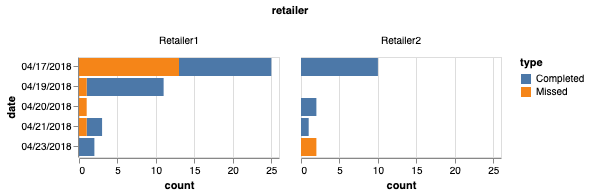

In [161]:
print("=== benchmark 77")
print("# input-table")
display(df58)
print("# visualization")
display(VegaLite(chart58, df58))

=== benchmark 78
# input-table


group,ID,time,personsg1,personsg2
0,1,0min,1,10
1,1,10min,4,13
2,1,30min,7,16
3,2,0min,2,11
4,2,10min,5,14
5,2,30min,8,17
6,3,0min,3,12
7,3,10min,6,15
8,3,30min,9,18


# visualization


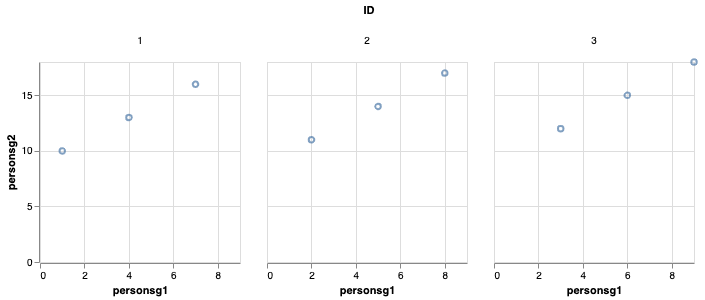

In [162]:
print("=== benchmark 78")
print("# input-table")
display(df59)
print("# visualization")
display(VegaLite(chart59, df59))

=== benchmark 79
# input-table


fac,g,trial1,trial2
0,0,1.0355,1.7138
1,1,1.4998,2.6099
2,2,2.1847,4.3185
3,3,1.0140,2.8532
4,4,1.8388,3.2195
5,5,1.3549,4.4374
6,6,0.9128,2.1362
7,7,1.6856,2.5519
8,8,3.0877,1.2056
9,9,3.2488,2.6400


# visualization


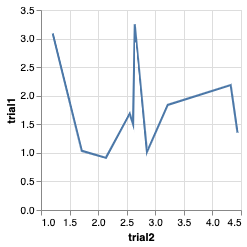

In [163]:
print("=== benchmark 79")
print("# input-table")
display(df60)
print("# visualization")
display(VegaLite(chart60, df60))

=== benchmark 80
# input-table


,Product,Profit %,Sales growth,variable,value
0,Prod1,42,6,Sales Increase,29
1,Prod2,48,1,Sales Increase,18
2,Prod3,10,-3,Sales Increase,7
3,Prod4,16,15,Sales Increase,11
4,Prod5,10,-6,Sales Increase,2
5,Prod6,45,11,Sales Increase,14
6,Prod7,50,2,Sales Increase,36
7,Prod8,39,1,Sales Increase,25
8,Prod9,30,-4,Sales Increase,7
9,Prod10,12,15,Sales Increase,10


# visualization


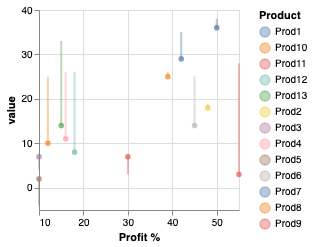

In [164]:
print("=== benchmark 80")
print("# input-table")
display(df_t19)
print("# visualization")
display(VegaLite(chart_t19, df_t19))

=== benchmark 81
# input-table


,activity,variable,value
0,Playing billiards,0,3172.450
1,Dancing,0,16784.600
2,Softball,0,0.000
3,Bowling,0,1154.160
4,Playing volleyball,0,0.000
5,Participating in martial arts,0,0.000
6,Playing racquet sports,0,0.000
7,Biking,0,0.000
8,Weightlifting/strength training,0,2585.530
9,Doing yoga,0,539.279


# visualization


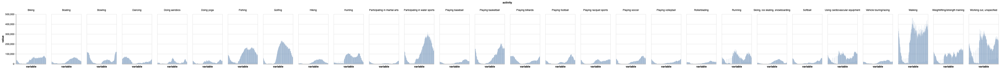

In [165]:
print("=== benchmark 81")
print("# input-table")
display(df33)
print("# visualization")
display(VegaLite(chart33, df33))

=== benchmark 82
# input-table


,Country Name,Date,Type,month,day
0,Bangladesh,1/5/14,Legislative,1,5
1,Egypt,1/14/14,Referendum,1,14
2,Costa Rica,2/2/14,President,2,2
3,Costa Rica,2/2/14,Legislative,2,2
4,El Salvador,2/2/14,President,2,2
5,Thailand,2/2/14,Legislative,2,2
6,Switzerland,2/9/14,Referendum,2,9
7,Macedonia,3/1/14,President,3,1
8,North Korea,3/9/14,Legislative,3,9
9,Slovakia,3/15/14,President,3,15


# visualization


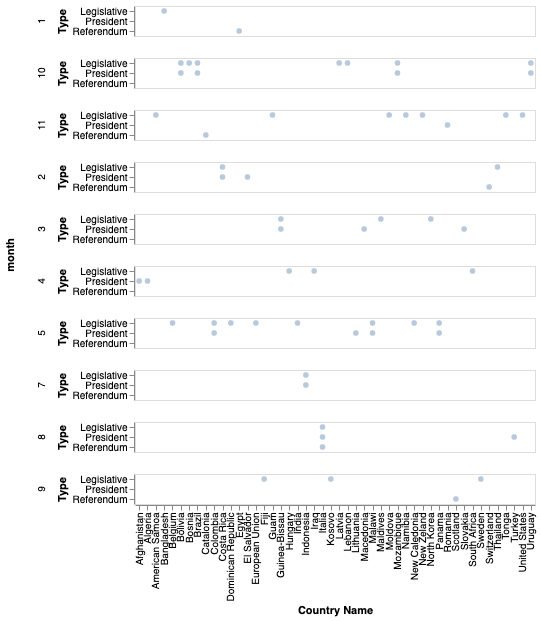

In [166]:
print("=== benchmark 82")
print("# input-table")
display(df_t21)
print("# visualization")
display(VegaLite(chart_t21, df_t21))

=== benchmark 83
# input-table


,year,variable,value
0,2011,Q1,27
1,2011,Q2,35
2,2011,Q3,31
3,2011,Q4,24
4,2012,Q1,26
5,2012,Q2,36
6,2012,Q3,35
7,2012,Q4,30
8,2013,Q1,35
9,2013,Q2,27


# visualization


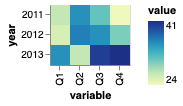

In [167]:
print("=== benchmark 83")
print("# input-table")
display(df_t23)
print("# visualization")
display(VegaLite(chart_t23, df_t23))